# **DATA VISUALIZATION TECHNIQUES**

Other Plots


There are many other plotting styles available other than the default Line plot, all of which can be accessed by passing kind keyword to plot(). The full list of available plots are as follows:

+ `bar` for vertical bar plots
+ `barh` for horizontal bar plots
+ `hist` for histogram
+ `box` for boxplot
+ `kde` or density for density plots
+ `area` for area plots
+ `pie` for pie plots
+ `scatter` for scatter plots
+ `hexbin` for hexbin plot

**Contents**

+ Explain how to generate an area plot using Matplotlib
+ Describe why and how to create histograms using Matplotlib
+ Explain how to create bar charts
+ Create pie charts using Matplotlib
+ Create a box plot using Matplotlib

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# use the inline backend to generate the plots within the browser
%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot')  # optional: for ggplot-like style

# check for latest version of Matplotlib
print('Matplotlib version: ', mpl.__version__) # >= 2.0.0

Matplotlib version:  3.7.0


In [21]:
## read the dataset
df_can = pd.read_csv("cleaned_data.csv", index_col=0)
df_can.head()

,Country,Continent,Region,Developed / Developing,1980,1981,1982,1983,1984,1985,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
0,Afghanistan,Asia,Southern Asia,Developing regions,16,39,39,47,71,340,...,3436,3009,2652,2111,1746,1758,2203,2635,2004,117278
1,Albania,Europe,Southern Europe,Developed regions,1,0,0,0,0,0,...,1223,856,702,560,716,561,539,620,603,31398
2,Algeria,Africa,Northern Africa,Developing regions,80,67,71,69,63,44,...,3626,4807,3623,4005,5393,4752,4325,3774,4331,138878
3,American Samoa,Oceania,Polynesia,Developing regions,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,12
4,Andorra,Europe,Southern Europe,Developed regions,0,0,0,0,0,0,...,0,1,1,0,0,0,0,1,1,30


In [22]:
## For consistency, ensure that all column labels of type string
# let's examine the types of the column labels
all(isinstance(column, str) for column in df_can.columns)

True

In [23]:
print(df_can.columns.tolist())

['Country', 'Continent', 'Region', 'Developed / Developing', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', 'Total']


In [24]:
## make the index column as Country
df_can.set_index('Country', inplace=True)
# Let's view the first five elements and see how the dataframe was changed
df_can.head()

,Continent,Region,Developed / Developing,1980,1981,1982,1983,1984,1985,1986,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,Asia,Southern Asia,Developing regions,16,39,39,47,71,340,496,...,3436,3009,2652,2111,1746,1758,2203,2635,2004,117278
Albania,Europe,Southern Europe,Developed regions,1,0,0,0,0,0,1,...,1223,856,702,560,716,561,539,620,603,31398
Algeria,Africa,Northern Africa,Developing regions,80,67,71,69,63,44,69,...,3626,4807,3623,4005,5393,4752,4325,3774,4331,138878
American Samoa,Oceania,Polynesia,Developing regions,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,12
Andorra,Europe,Southern Europe,Developed regions,0,0,0,0,0,0,2,...,0,1,1,0,0,0,0,1,1,30


In [25]:
# finally, let's create a list of years from 1980 - 2013
# this will come in handy when we start plotting the data
years = list(map(str, range(1980, 2014)))

print(years)

['1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013']


**AREA PLOTS**

+ Plotting a Stacked Area Plot.
+ Cumulative Area Plot.
+ Using the Infomation of Top5 Immigrant Countries to Canada.

In [32]:
## sort the dataframe first
df_top5 = df_can.sort_values(by = "Total", ascending = False, inplace = True)
## choose the first five rows, it will be top 5 valued rows.
df_top5  = df_can.head(5)
df_top5

,Continent,Region,Developed / Developing,1980,1981,1982,1983,1984,1985,1986,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
Country,,,,,,,,,,,,,,,,,,,,,
India,Asia,Southern Asia,Developing regions,8880,8670,8147,7338,5704,4211,7150,...,36210,33848,28742,28261,29456,34235,27509,30933,33087,1383808
China,Asia,Eastern Asia,Developing regions,5123,6682,3308,1863,1527,1816,1960,...,42584,33518,27642,30037,29622,30391,28502,33024,34129,1319924
United Kingdom of Great Britain and Northern Ireland,Europe,Northern Europe,Developed regions,22045,24796,20620,10015,10170,9564,9470,...,7258,7140,8216,8979,8876,8724,6204,6195,5827,1103000
Philippines,Asia,South-Eastern Asia,Developing regions,6051,5921,5249,4562,3801,3150,4166,...,18139,18400,19837,24887,28573,38617,36765,34315,29544,1022782
Pakistan,Asia,Southern Asia,Developing regions,978,972,1201,900,668,514,691,...,14314,13127,10124,8994,7217,6811,7468,11227,12603,483200


In [33]:
# transpose the dataframe
df_top5 = df_top5[years].transpose()
df_top5

Country,India,China,United Kingdom of Great Britain and Northern Ireland,Philippines,Pakistan
1980,8880,5123,22045,6051,978
1981,8670,6682,24796,5921,972
1982,8147,3308,20620,5249,1201
1983,7338,1863,10015,4562,900
1984,5704,1527,10170,3801,668
1985,4211,1816,9564,3150,514
1986,7150,1960,9470,4166,691
1987,10189,2643,21337,7360,1072
1988,11522,2758,27359,8639,1334
1989,10343,4323,23795,11865,2261


+ Area plots are stacked by default. 
+ And to produce a stacked area plot, each column must be either all positive or all negative values (any NaN, i.e. not a number, values will default to 0). 
+ To produce an unstacked plot, set parameter stacked to value False.

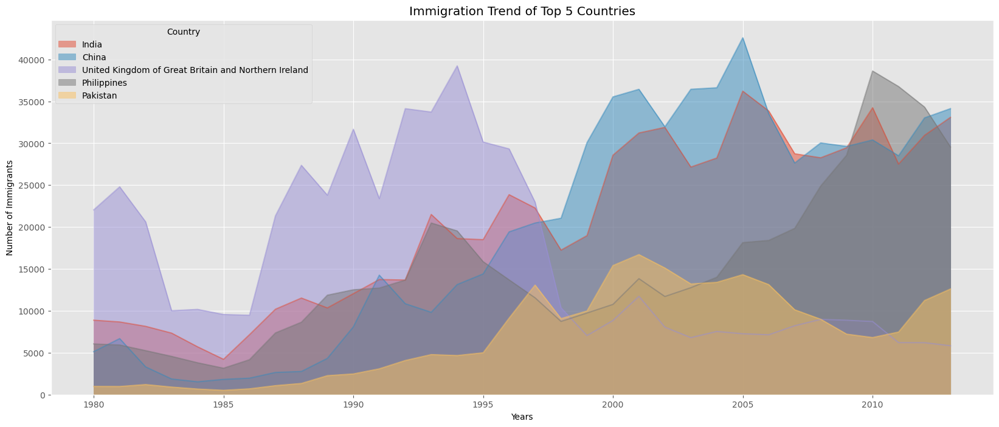

In [36]:
# let's change the index values of df_top5 to type integer for plotting
df_top5.index = df_top5.index.map(int)
df_top5.plot(kind='area',
             stacked=False,
             figsize=(20, 8))  # pass a tuple (x, y) size

plt.title('Immigration Trend of Top 5 Countries')
plt.ylabel('Number of Immigrants')
plt.xlabel('Years')

plt.show()

+ The unstacked plot has a default transparency (alpha value) at 0.5. We can modify this value by passing in the alpha parameter.

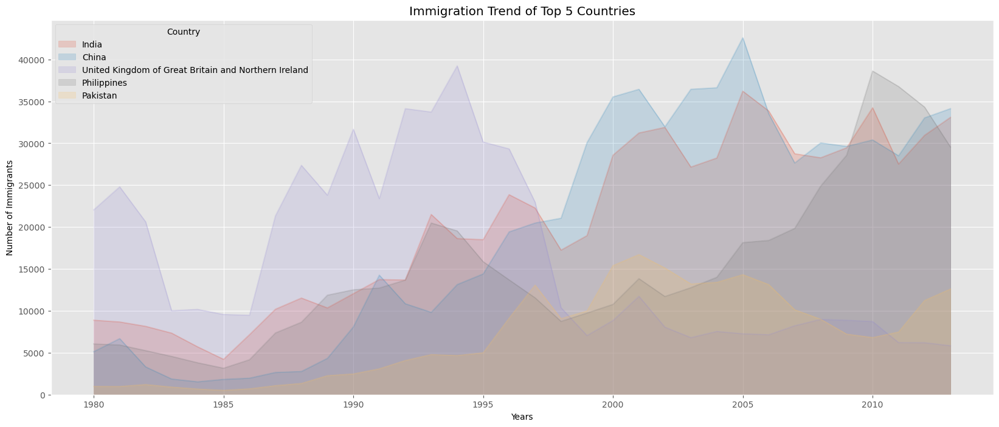

In [39]:
df_top5.plot(kind='area', 
             alpha=0.2,  # 0 - 1, default value alpha = 0.5
             stacked=False,
             figsize=(20, 8))

plt.title('Immigration Trend of Top 5 Countries')
plt.ylabel('Number of Immigrants')
plt.xlabel('Years')

plt.show()

Text(0.5, 0, 'Years')

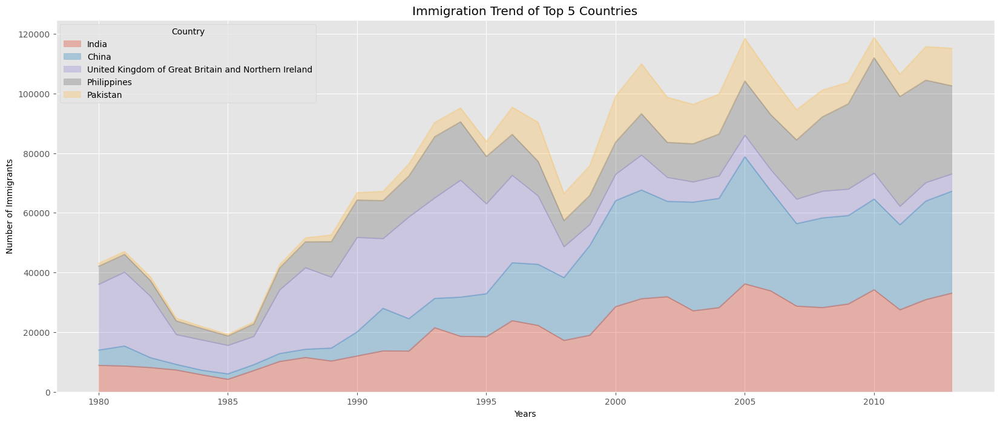

In [41]:
# option 2: preferred option with more flexibility
ax = df_top5.plot(kind='area', alpha=0.35, figsize=(20, 8))

ax.set_title('Immigration Trend of Top 5 Countries')
ax.set_ylabel('Number of Immigrants')
ax.set_xlabel('Years')

**TWO TYPES OF PLOTTING**

1. Scripting layer (procedural method) - using matplotlib.pyplot as 'plt'.
2. Artist layer (Object oriented method) - using an Axes instance from Matplotlib (preferred)

**Question: Use the artist layer to create a stacked area plot of the 5 countries that contributed the least to immigration to Canada from 1980 to 2013. Use a transparency value of 0.45.**

Text(0.5, 0, 'Years')

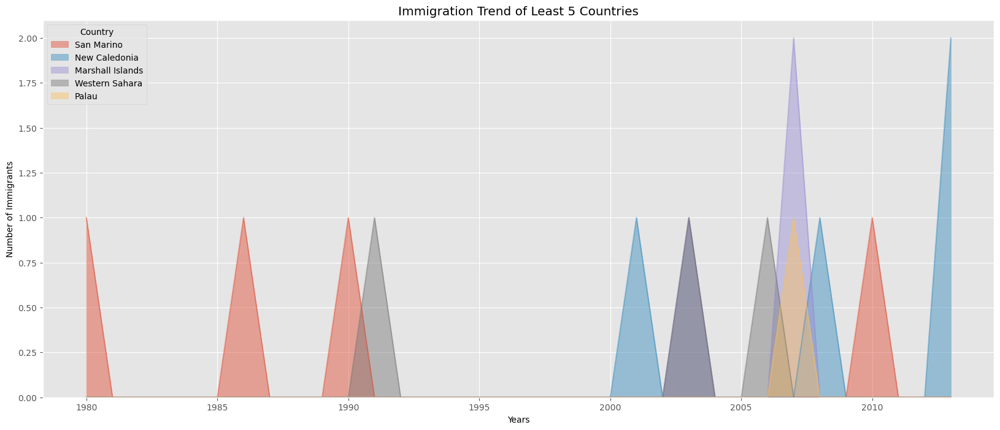

In [48]:
df_can.head()

## choose the least 5 countries.
## it can be get by tail method
df_least_5 = df_can.tail(5)
df_least_5

## take the transpose of the df_least_5
df_least_5 = df_least_5[years].transpose()

ax = df_least_5.plot(kind='area', alpha=0.45, stacked = False, figsize=(20, 8))

ax.set_title('Immigration Trend of Least 5 Countries')
ax.set_ylabel('Number of Immigrants')
ax.set_xlabel('Years')

**Question: Use the script layer to create a stacked area plot of the 5 countries that contributed the least to immigration to Canada from 1980 to 2013. Use a transparency value of 0.45.**

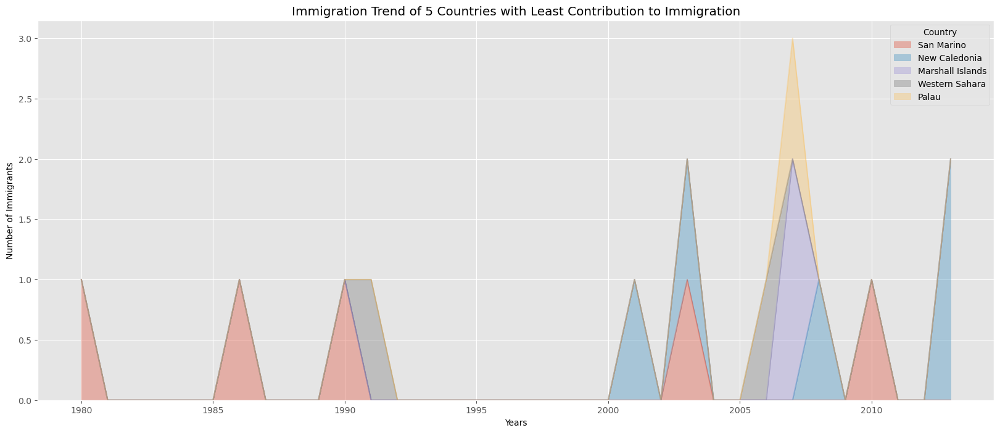

In [49]:
df_can.head()

## choose the least 5 countries.
## it can be get by tail method
df_least_5 = df_can.tail(5)
df_least_5

## take the transpose of the df_least_5
df_least_5 = df_least_5[years].transpose()

df_least_5.plot(kind = "area", alpha = 0.35, figsize = (20,8))
plt.title('Immigration Trend of 5 Countries with Least Contribution to Immigration')
plt.ylabel('Number of Immigrants')
plt.xlabel('Years')

plt.show()

**HISTOGRAM**

+ A histogram is a way of representing the frequency distribution of numeric dataset. 
+ The way it works is it partitions the x-axis into bins, assigns each data point in our dataset to a bin, and then counts the number of data points that have been assigned to each bin. 
+ So the y-axis is the frequency or the number of data points in each bin. 
+ Note that we can change the bin size and usually one needs to tweak it so that the distribution is displayed nicely.

**Question: What is the frequency distribution of the number (population) of new immigrants from the various countries to Canada in 2013?**

In [52]:
df_can.head()

,Continent,Region,Developed / Developing,1980,1981,1982,1983,1984,1985,1986,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,Total
Country,,,,,,,,,,,,,,,,,,,,,
India,Asia,Southern Asia,Developing regions,8880,8670,8147,7338,5704,4211,7150,...,36210,33848,28742,28261,29456,34235,27509,30933,33087,1383808
China,Asia,Eastern Asia,Developing regions,5123,6682,3308,1863,1527,1816,1960,...,42584,33518,27642,30037,29622,30391,28502,33024,34129,1319924
United Kingdom of Great Britain and Northern Ireland,Europe,Northern Europe,Developed regions,22045,24796,20620,10015,10170,9564,9470,...,7258,7140,8216,8979,8876,8724,6204,6195,5827,1103000
Philippines,Asia,South-Eastern Asia,Developing regions,6051,5921,5249,4562,3801,3150,4166,...,18139,18400,19837,24887,28573,38617,36765,34315,29544,1022782
Pakistan,Asia,Southern Asia,Developing regions,978,972,1201,900,668,514,691,...,14314,13127,10124,8994,7217,6811,7468,11227,12603,483200


In [53]:
# let's quickly view the 2013 data
df_can['2013'].head()

Country
India                                                   33087
China                                                   34129
United Kingdom of Great Britain and Northern Ireland     5827
Philippines                                             29544
Pakistan                                                12603
Name: 2013, dtype: int64

In [54]:
# np.histogram returns 2 values
count, bin_edges = np.histogram(df_can['2013'])

print(count) # frequency count
print(bin_edges) # bin ranges, default = 10 bins

[178  11   1   2   0   0   0   0   1   2]
[    0.   3412.9  6825.8 10238.7 13651.6 17064.5 20477.4 23890.3 27303.2
 30716.1 34129. ]


By default, the histrogram method breaks up the dataset into 10 bins. We can see that in 2013:

+ 178 countries contributed between 0 to 3412.9 immigrants
+ 11 countries contributed between 3412.9 to 6825.8 immigrants
+ 1 country contributed between 6285.8 to 10238.7 immigrants, and so on.

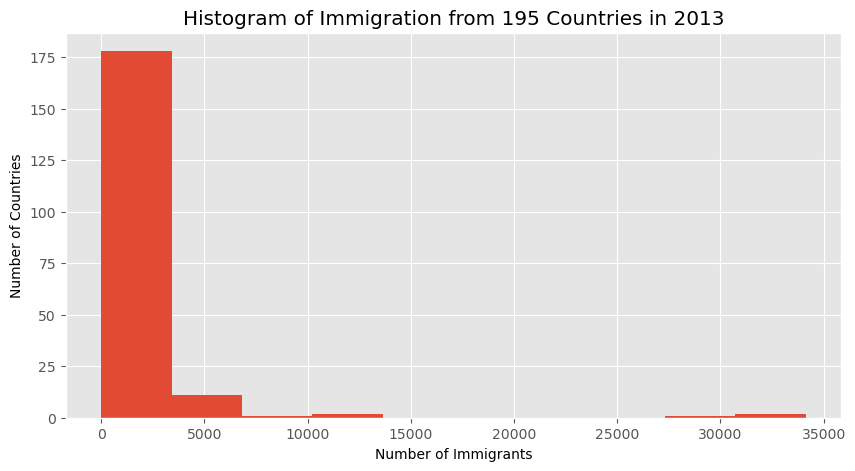

In [55]:
## graph this distribution by passing kind=hist to plot().
df_can['2013'].plot(kind='hist', figsize=(10, 5))

# add a title to the histogram
plt.title('Histogram of Immigration from 195 Countries in 2013')
# add y-label
plt.ylabel('Number of Countries')
# add x-label
plt.xlabel('Number of Immigrants')

plt.show()

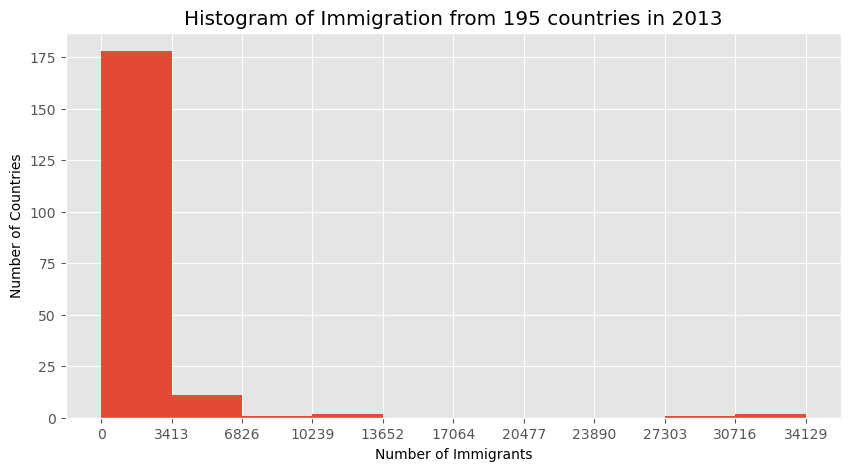

In [58]:
## In the above plot, the x-axis represents the population range of immigrants in intervals of 3412.9. 
##The y-axis represents the number of countries that contributed to the aforementioned population.
##Notice that the x-axis labels do not match with the bin size. This can be fixed by passing in a xticks keyword that contains the list of the bin sizes, as follows:

# 'bin_edges' is a list of bin intervals
count, bin_edges = np.histogram(df_can['2013'])

df_can['2013'].plot(kind='hist', figsize=(10, 5), xticks=bin_edges)

plt.title('Histogram of Immigration from 195 countries in 2013') # add a title to the histogram
plt.ylabel('Number of Countries') # add y-label
plt.xlabel('Number of Immigrants') # add x-label

plt.show()

In [60]:
print(years)

['1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013']


In [62]:
def histogram_fpr_every_year_distribution(year):
    for year in years:
        ## define count and bin edges.
        count, bin_edges = np.histogram(df_can[year])
        print("Count Statistics :--",count)
        print("Bins Details :--", bin_edges)
        
        

Count Statistics :-- [187   2   3   0   2   0   0   0   0   1]
Bins Details :-- [    0.   2204.5  4409.   6613.5  8818.  11022.5 13227.  15431.5 17636.
 19840.5 22045. ]


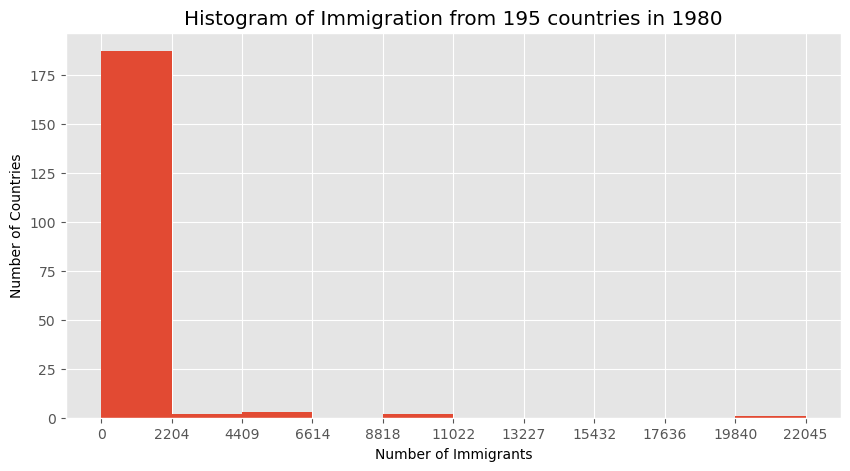

Count Statistics :-- [185   5   2   1   1   0   0   0   0   1]
Bins Details :-- [    0.   2479.6  4959.2  7438.8  9918.4 12398.  14877.6 17357.2 19836.8
 22316.4 24796. ]


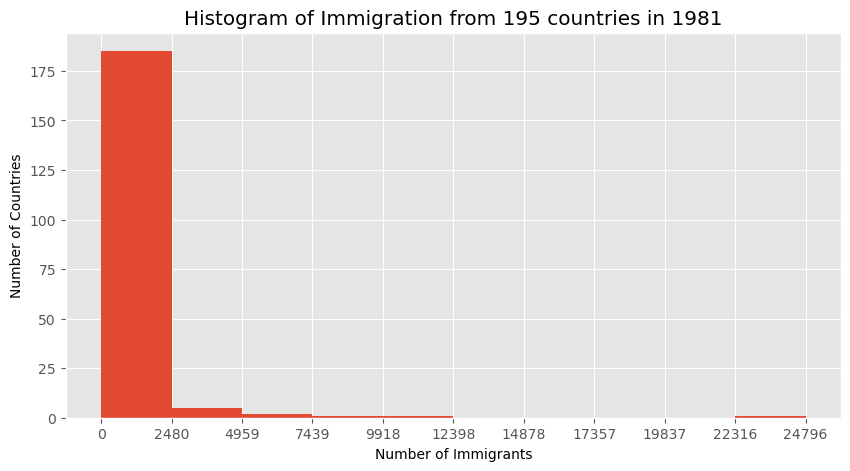

Count Statistics :-- [182   8   2   1   1   0   0   0   0   1]
Bins Details :-- [    0.  2062.  4124.  6186.  8248. 10310. 12372. 14434. 16496. 18558.
 20620.]


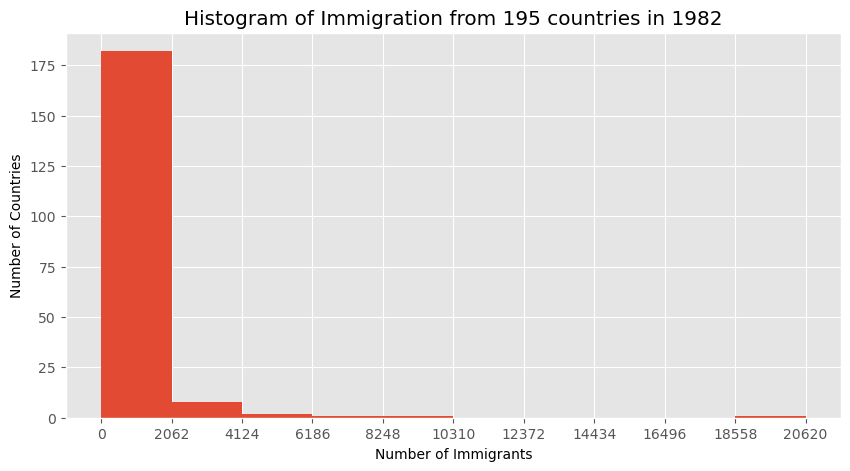

Count Statistics :-- [179   5   5   1   2   0   0   2   0   1]
Bins Details :-- [    0.   1001.5  2003.   3004.5  4006.   5007.5  6009.   7010.5  8012.
  9013.5 10015. ]


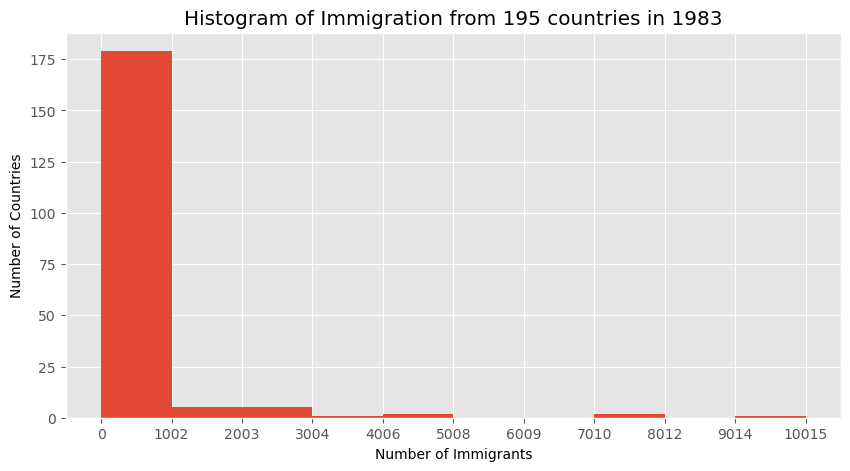

Count Statistics :-- [178   9   2   2   0   1   1   1   0   1]
Bins Details :-- [    0.  1017.  2034.  3051.  4068.  5085.  6102.  7119.  8136.  9153.
 10170.]


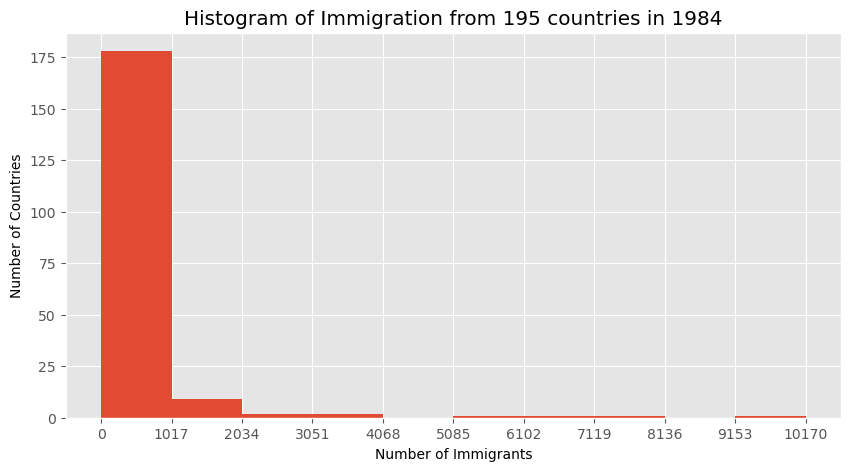

Count Statistics :-- [177   9   3   2   1   0   2   0   0   1]
Bins Details :-- [   0.   956.4 1912.8 2869.2 3825.6 4782.  5738.4 6694.8 7651.2 8607.6
 9564. ]


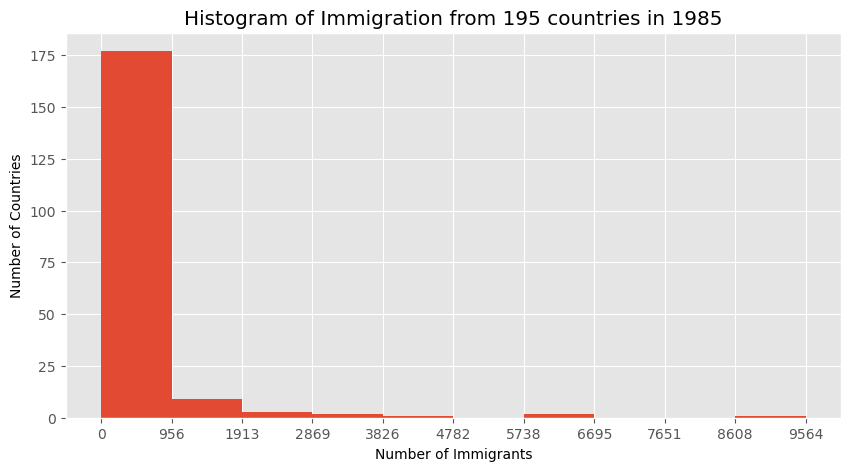

Count Statistics :-- [174   9   4   1   3   1   0   2   0   1]
Bins Details :-- [   0.  947. 1894. 2841. 3788. 4735. 5682. 6629. 7576. 8523. 9470.]


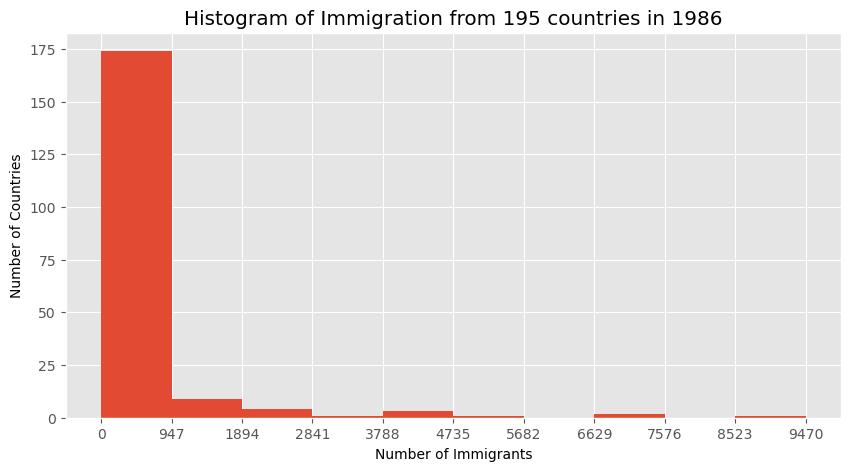

Count Statistics :-- [181   5   3   4   1   0   0   0   0   1]
Bins Details :-- [    0.   2133.7  4267.4  6401.1  8534.8 10668.5 12802.2 14935.9 17069.6
 19203.3 21337. ]


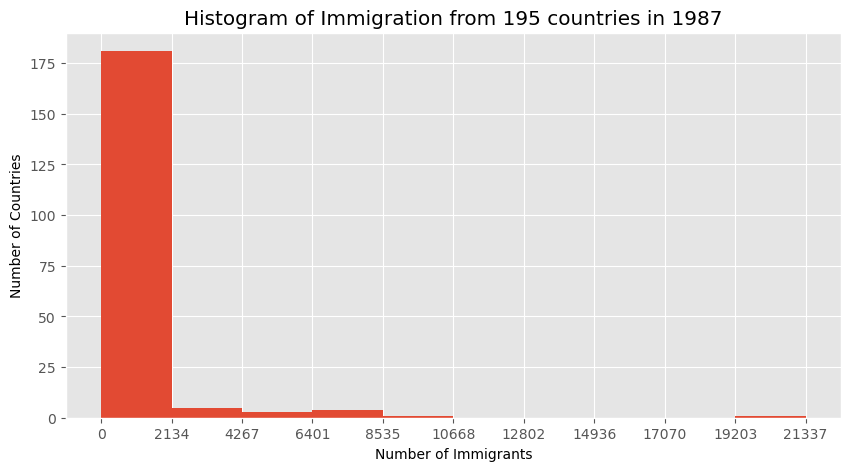

Count Statistics :-- [182   7   2   2   1   0   0   0   0   1]
Bins Details :-- [    0.   2735.9  5471.8  8207.7 10943.6 13679.5 16415.4 19151.3 21887.2
 24623.1 27359. ]


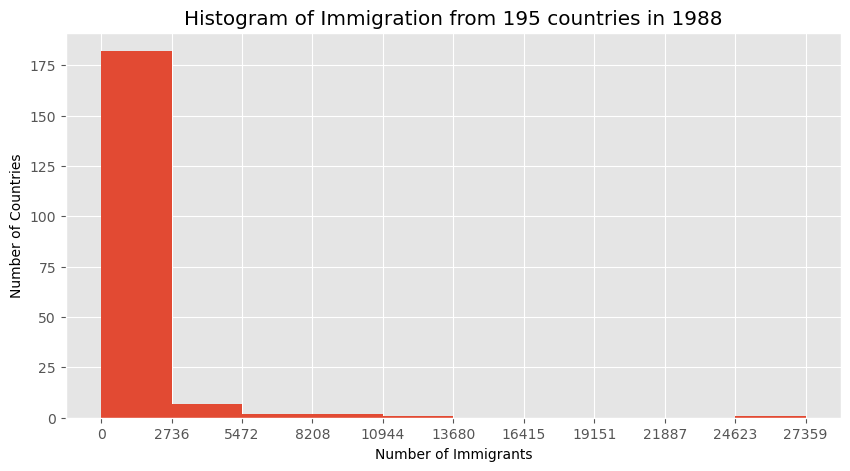

Count Statistics :-- [179   9   1   2   2   0   1   0   0   1]
Bins Details :-- [    0.   2379.5  4759.   7138.5  9518.  11897.5 14277.  16656.5 19036.
 21415.5 23795. ]


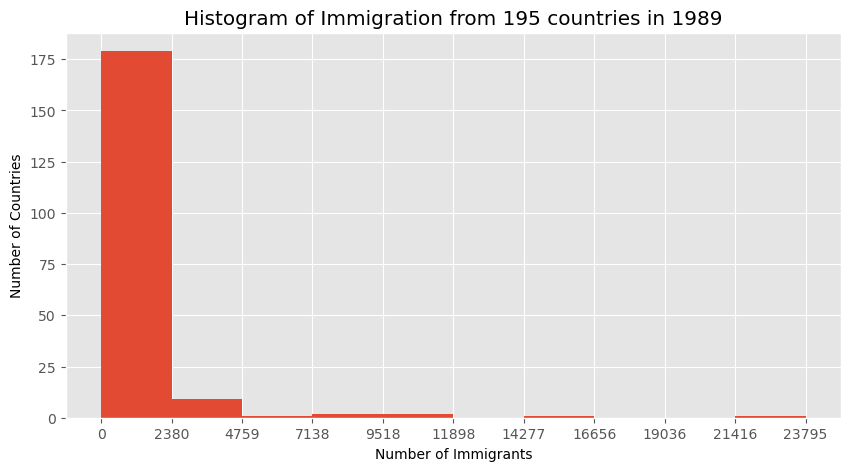

Count Statistics :-- [182   6   2   2   1   1   0   0   0   1]
Bins Details :-- [    0.   3166.8  6333.6  9500.4 12667.2 15834.  19000.8 22167.6 25334.4
 28501.2 31668. ]


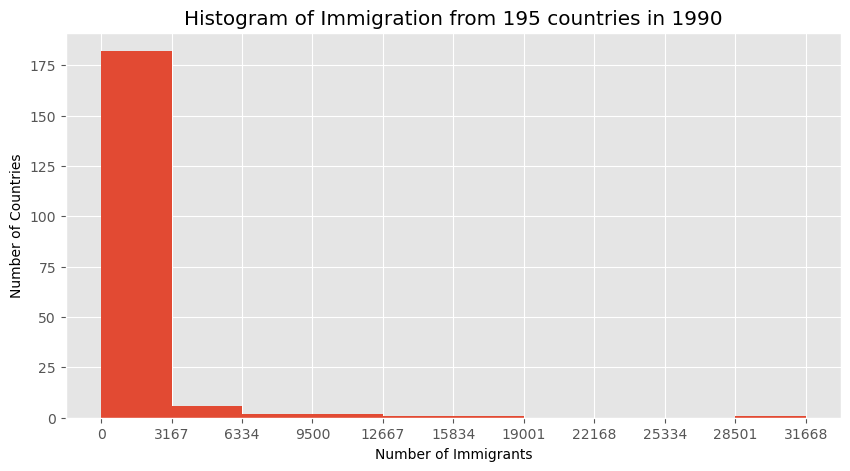

Count Statistics :-- [175   7   5   2   0   3   2   0   0   1]
Bins Details :-- [    0.  2338.  4676.  7014.  9352. 11690. 14028. 16366. 18704. 21042.
 23380.]


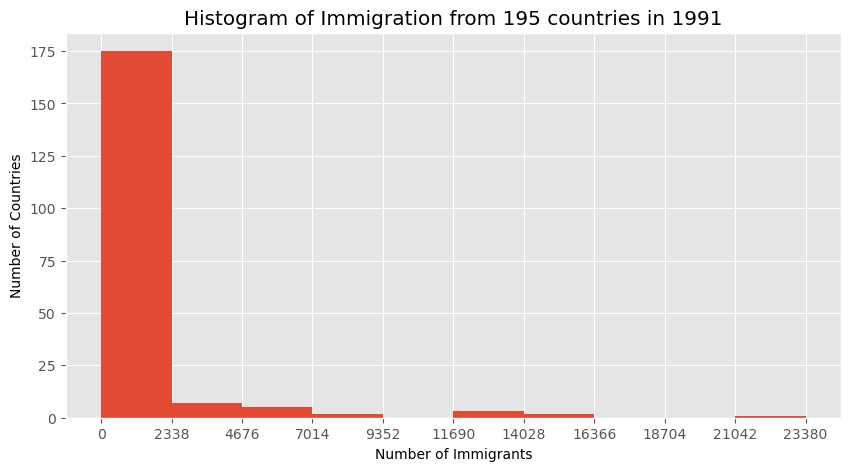

Count Statistics :-- [178   9   2   3   2   0   0   0   0   1]
Bins Details :-- [    0.   3412.3  6824.6 10236.9 13649.2 17061.5 20473.8 23886.1 27298.4
 30710.7 34123. ]


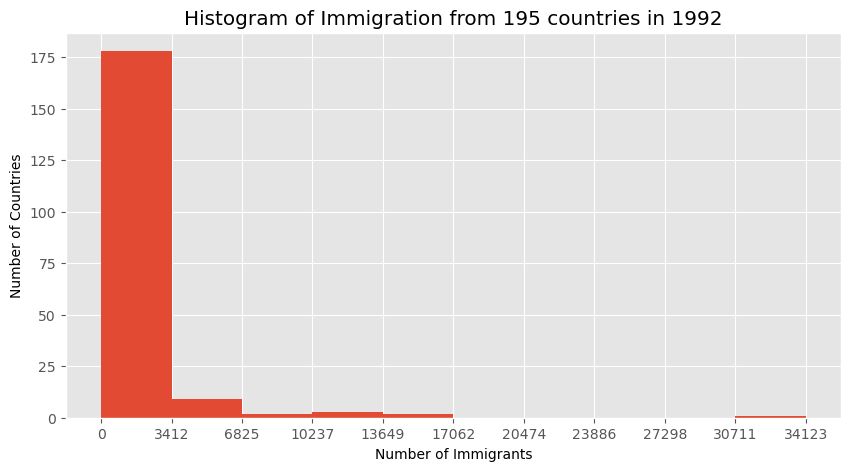

Count Statistics :-- [176  12   4   0   0   0   2   0   0   1]
Bins Details :-- [    0.  3372.  6744. 10116. 13488. 16860. 20232. 23604. 26976. 30348.
 33720.]


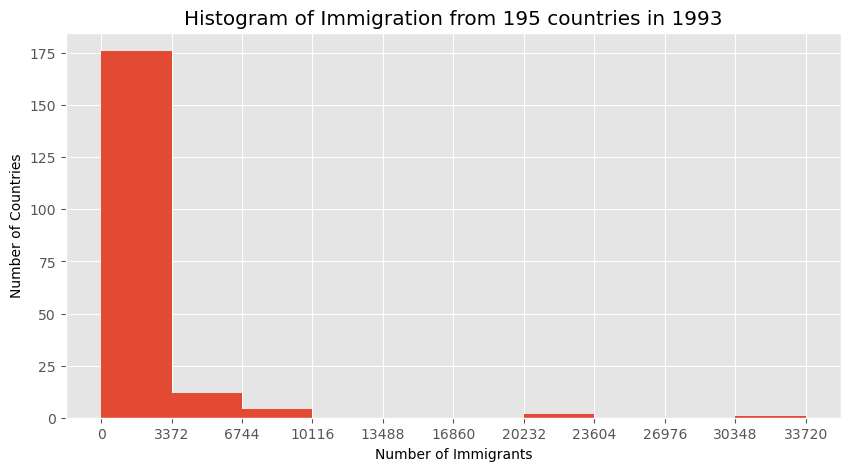

Count Statistics :-- [186   5   0   1   2   0   0   0   0   1]
Bins Details :-- [    0.   3923.1  7846.2 11769.3 15692.4 19615.5 23538.6 27461.7 31384.8
 35307.9 39231. ]


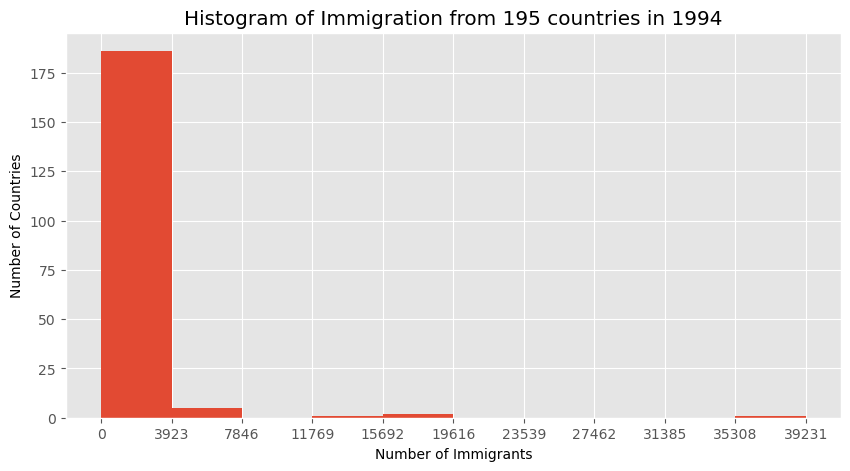

Count Statistics :-- [181   9   0   1   1   1   1   0   0   1]
Bins Details :-- [    0.   3014.5  6029.   9043.5 12058.  15072.5 18087.  21101.5 24116.
 27130.5 30145. ]


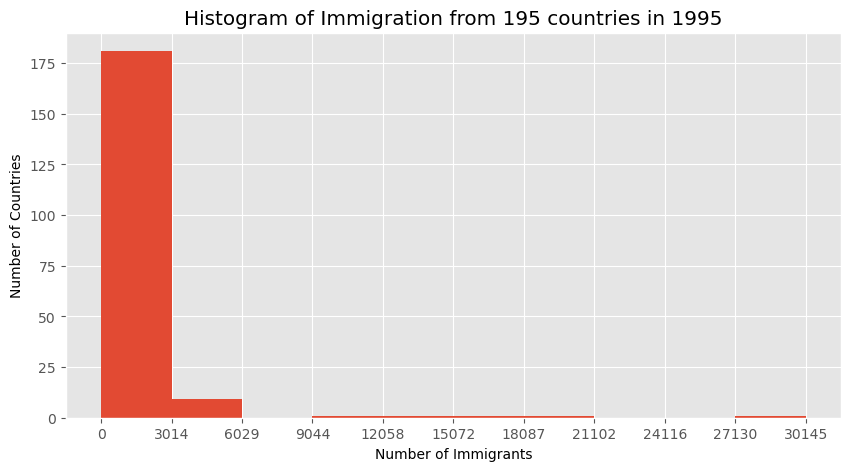

Count Statistics :-- [184   4   2   1   1   0   1   0   1   1]
Bins Details :-- [    0.   2932.2  5864.4  8796.6 11728.8 14661.  17593.2 20525.4 23457.6
 26389.8 29322. ]


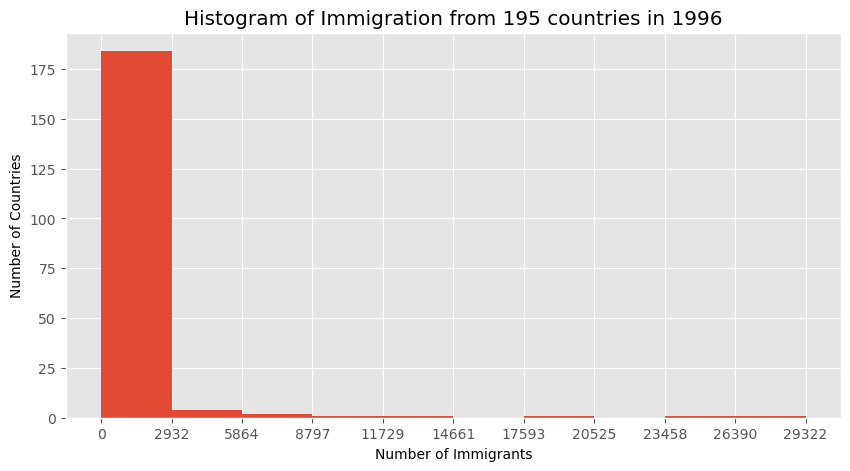

Count Statistics :-- [177  10   2   1   0   2   0   0   1   2]
Bins Details :-- [    0.   2296.5  4593.   6889.5  9186.  11482.5 13779.  16075.5 18372.
 20668.5 22965. ]


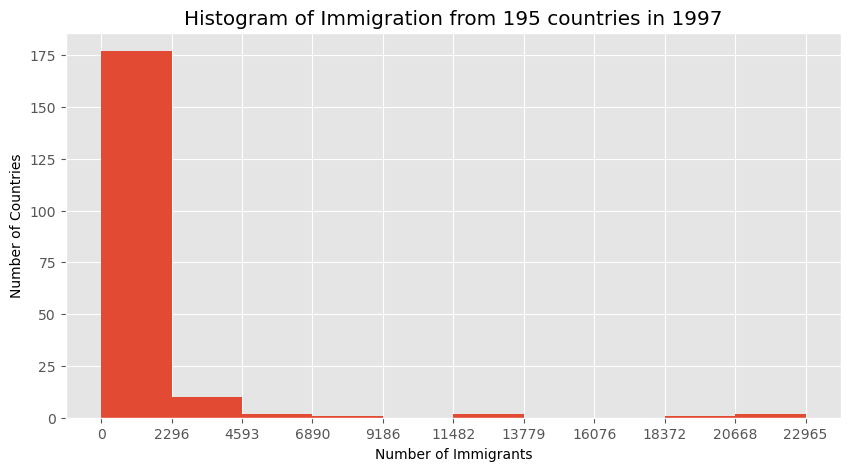

Count Statistics :-- [177   9   3   1   3   0   0   0   1   1]
Bins Details :-- [    0.   2104.9  4209.8  6314.7  8419.6 10524.5 12629.4 14734.3 16839.2
 18944.1 21049. ]


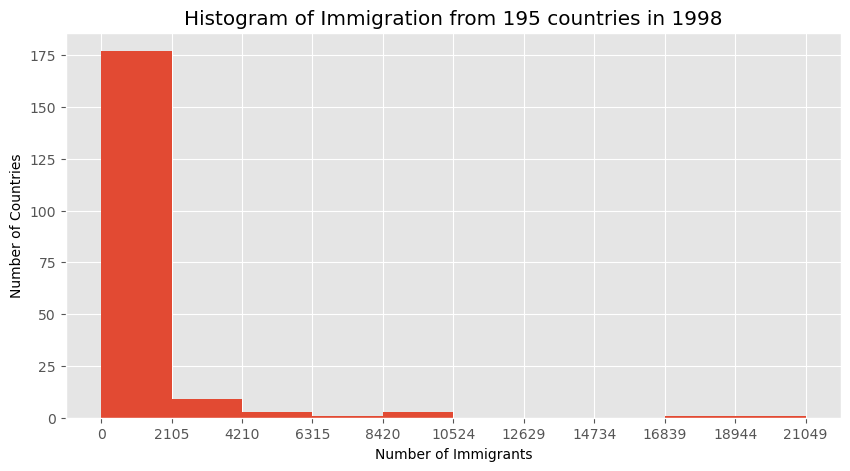

Count Statistics :-- [183   5   3   2   0   0   1   0   0   1]
Bins Details :-- [    0.   3006.9  6013.8  9020.7 12027.6 15034.5 18041.4 21048.3 24055.2
 27062.1 30069. ]


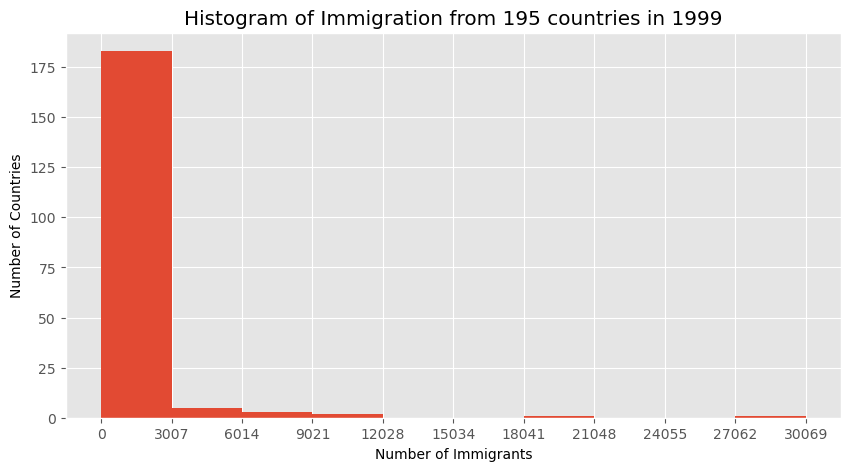

Count Statistics :-- [183   6   2   1   1   0   0   0   1   1]
Bins Details :-- [    0.   3552.9  7105.8 10658.7 14211.6 17764.5 21317.4 24870.3 28423.2
 31976.1 35529. ]


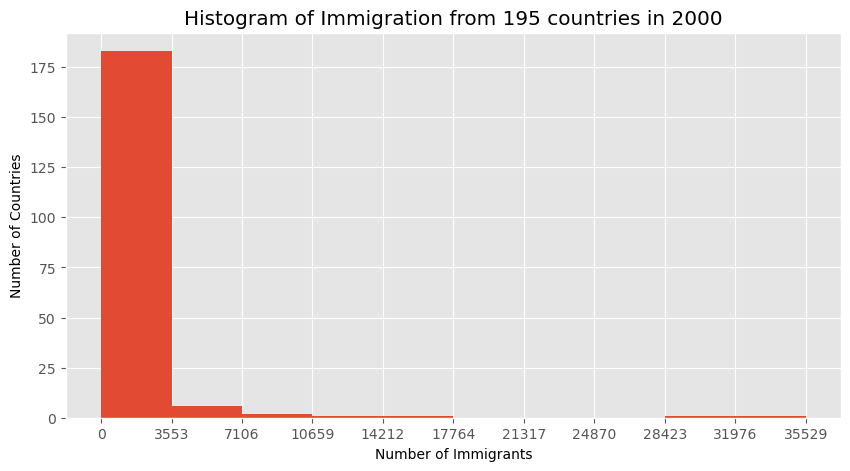

Count Statistics :-- [180   9   1   2   1   0   0   0   1   1]
Bins Details :-- [    0.   3643.4  7286.8 10930.2 14573.6 18217.  21860.4 25503.8 29147.2
 32790.6 36434. ]


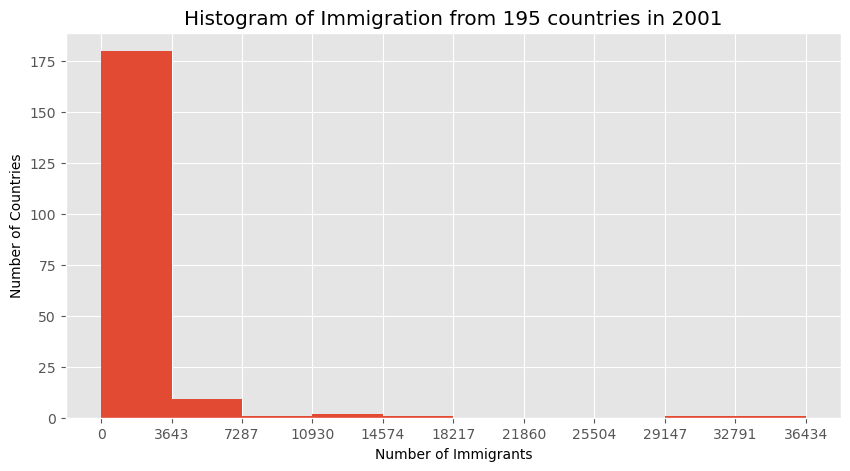

Count Statistics :-- [178  10   3   1   1   0   0   0   0   2]
Bins Details :-- [    0.   3196.1  6392.2  9588.3 12784.4 15980.5 19176.6 22372.7 25568.8
 28764.9 31961. ]


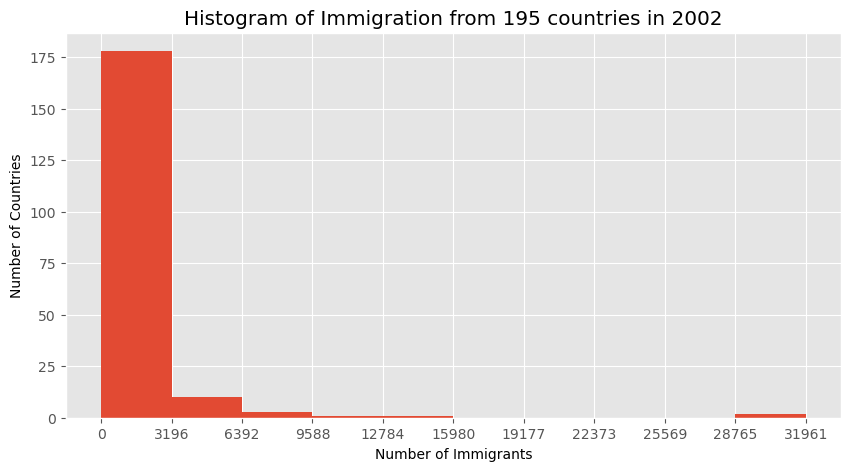

Count Statistics :-- [183   8   0   2   0   0   0   1   0   1]
Bins Details :-- [    0.   3643.9  7287.8 10931.7 14575.6 18219.5 21863.4 25507.3 29151.2
 32795.1 36439. ]


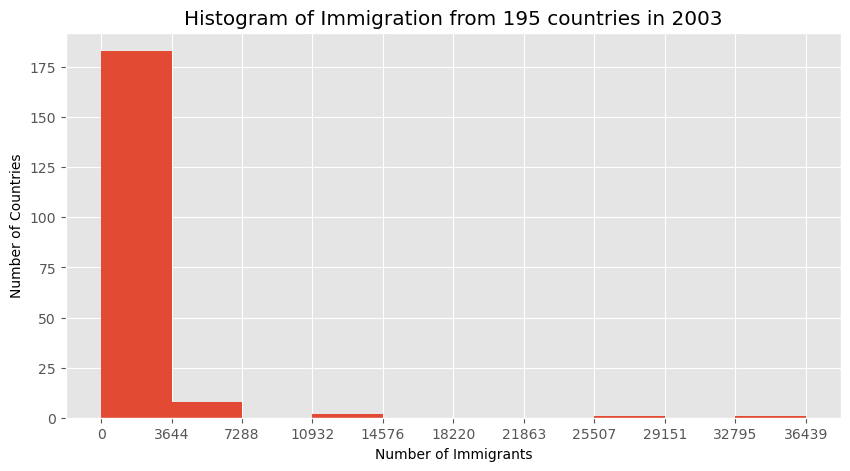

Count Statistics :-- [181   9   1   2   0   0   0   1   0   1]
Bins Details :-- [    0.   3661.9  7323.8 10985.7 14647.6 18309.5 21971.4 25633.3 29295.2
 32957.1 36619. ]


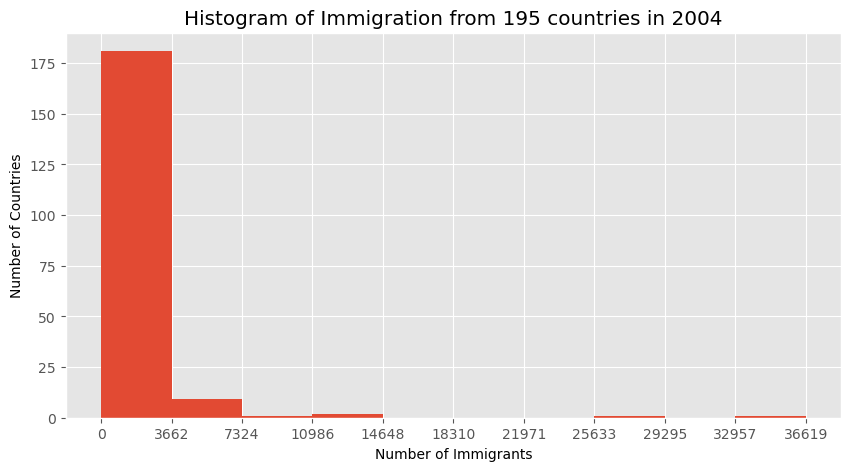

Count Statistics :-- [183   8   0   1   1   0   0   0   1   1]
Bins Details :-- [    0.   4258.4  8516.8 12775.2 17033.6 21292.  25550.4 29808.8 34067.2
 38325.6 42584. ]


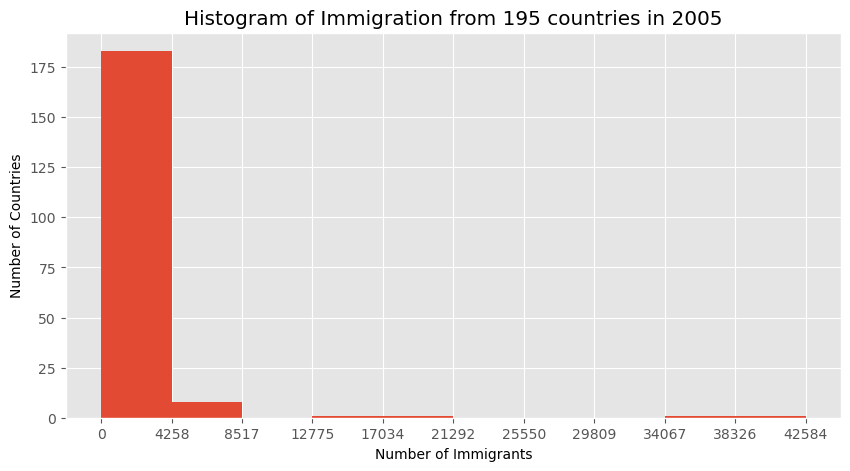

Count Statistics :-- [180   8   3   1   0   1   0   0   0   2]
Bins Details :-- [    0.   3384.8  6769.6 10154.4 13539.2 16924.  20308.8 23693.6 27078.4
 30463.2 33848. ]


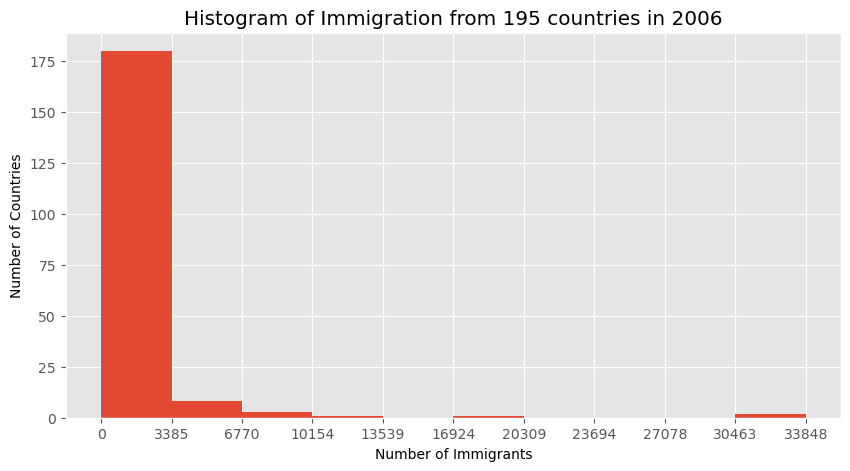

Count Statistics :-- [177  10   3   2   0   0   1   0   0   2]
Bins Details :-- [    0.   2874.2  5748.4  8622.6 11496.8 14371.  17245.2 20119.4 22993.6
 25867.8 28742. ]


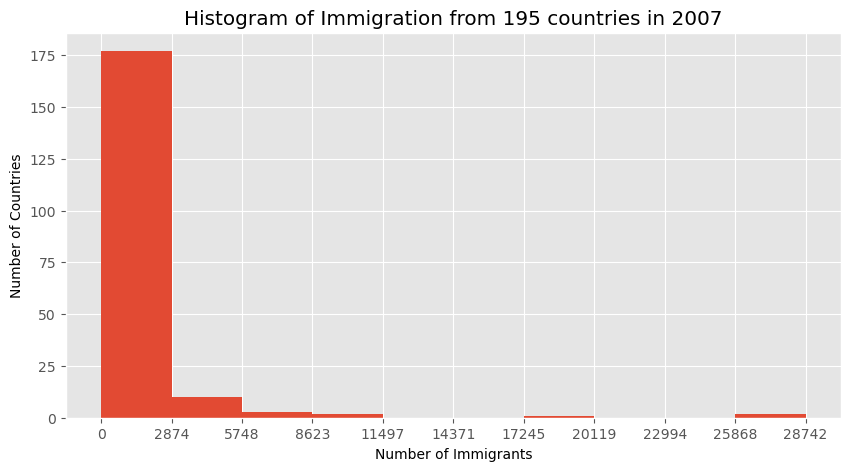

Count Statistics :-- [178   9   4   1   0   0   0   0   1   2]
Bins Details :-- [    0.   3003.7  6007.4  9011.1 12014.8 15018.5 18022.2 21025.9 24029.6
 27033.3 30037. ]


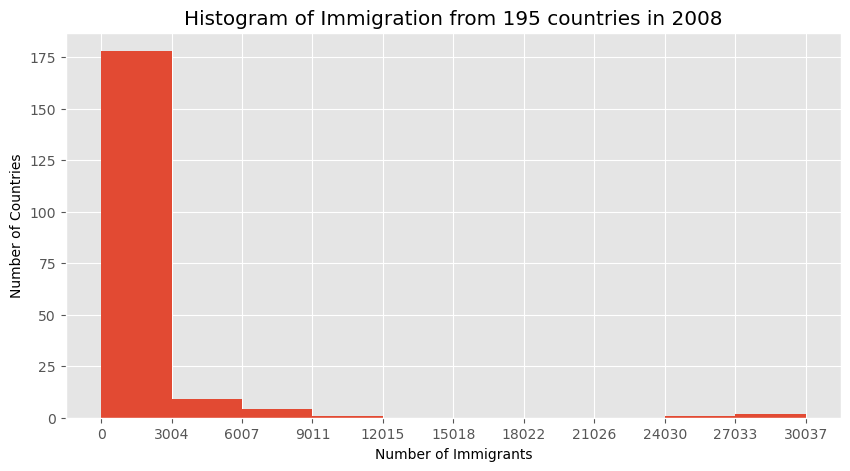

Count Statistics :-- [176  12   3   1   0   0   0   0   0   3]
Bins Details :-- [    0.   2962.2  5924.4  8886.6 11848.8 14811.  17773.2 20735.4 23697.6
 26659.8 29622. ]


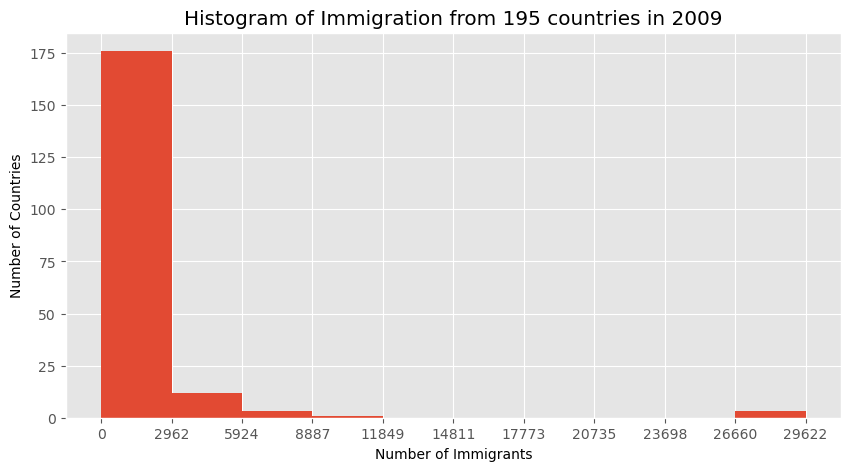

Count Statistics :-- [176  14   2   0   0   0   0   1   1   1]
Bins Details :-- [    0.   3861.7  7723.4 11585.1 15446.8 19308.5 23170.2 27031.9 30893.6
 34755.3 38617. ]


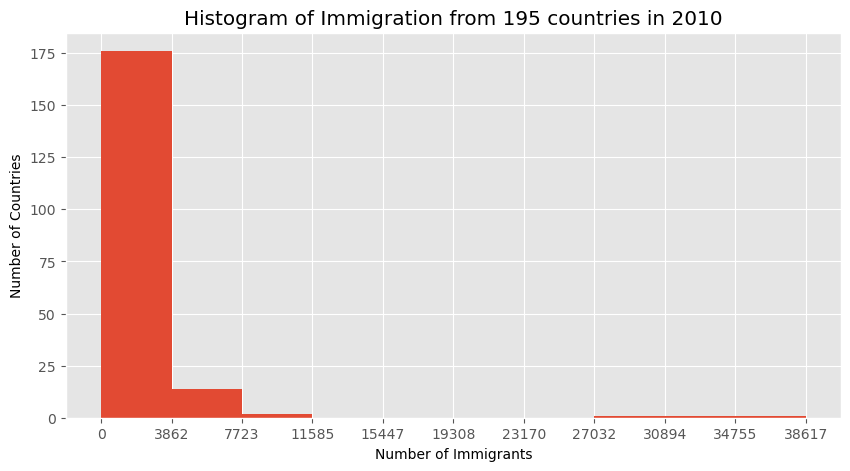

Count Statistics :-- [179  10   3   0   0   0   0   2   0   1]
Bins Details :-- [    0.   3676.5  7353.  11029.5 14706.  18382.5 22059.  25735.5 29412.
 33088.5 36765. ]


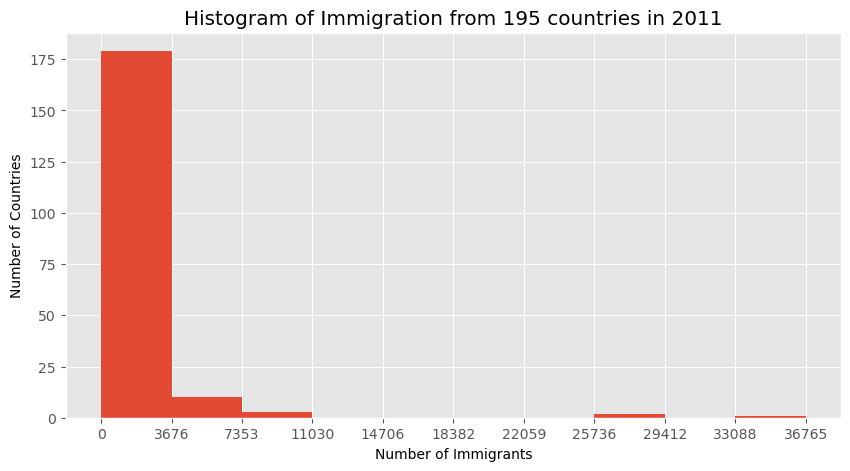

Count Statistics :-- [178  11   2   1   0   0   0   0   0   3]
Bins Details :-- [    0.   3431.5  6863.  10294.5 13726.  17157.5 20589.  24020.5 27452.
 30883.5 34315. ]


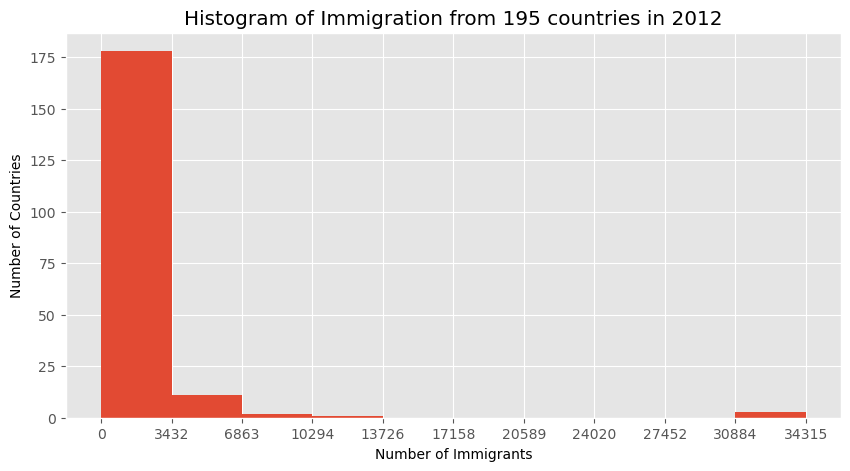

Count Statistics :-- [178  11   1   2   0   0   0   0   1   2]
Bins Details :-- [    0.   3412.9  6825.8 10238.7 13651.6 17064.5 20477.4 23890.3 27303.2
 30716.1 34129. ]


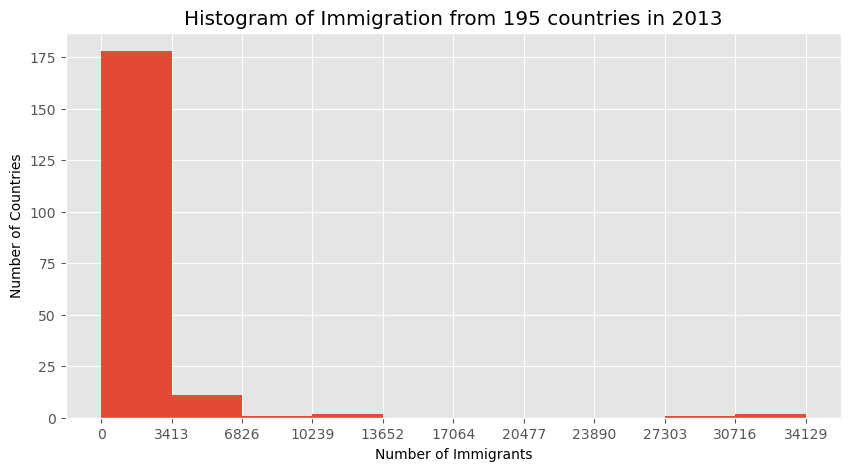

In [65]:
for year in years:
    ## define count and bin edges.
    count, bin_edges = np.histogram(df_can[year])
    print("Count Statistics :--",count)
    print("Bins Details :--", bin_edges)
    
    df_can[year].plot(kind='hist', figsize=(10, 5), xticks=bin_edges)
    
    plt.title('Histogram of Immigration from 195 countries in ' + year) # add a title to the histogram
    plt.ylabel('Number of Countries') # add y-label
    plt.xlabel('Number of Immigrants') # add x-label

    plt.show()

**MULTIPLE HISTOGRAM ON THE SAME PLOT**

**Question: What is the immigration distribution for Denmark, Norway, and Sweden for years 1980 - 2013?**

In [69]:
# let's quickly view the dataset 
df_can.loc[['Denmark', 'Norway', 'Sweden'], years]

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Country,,,,,,,,,,,,,,,,,,,,,
Denmark,272,293,299,106,93,73,93,109,129,129,...,89,62,101,97,108,81,92,93,94,81
Norway,116,77,106,51,31,54,56,80,73,76,...,73,57,53,73,66,75,46,49,53,59
Sweden,281,308,222,176,128,158,187,198,171,182,...,129,205,139,193,165,167,159,134,140,140


<Axes: ylabel='Frequency'>

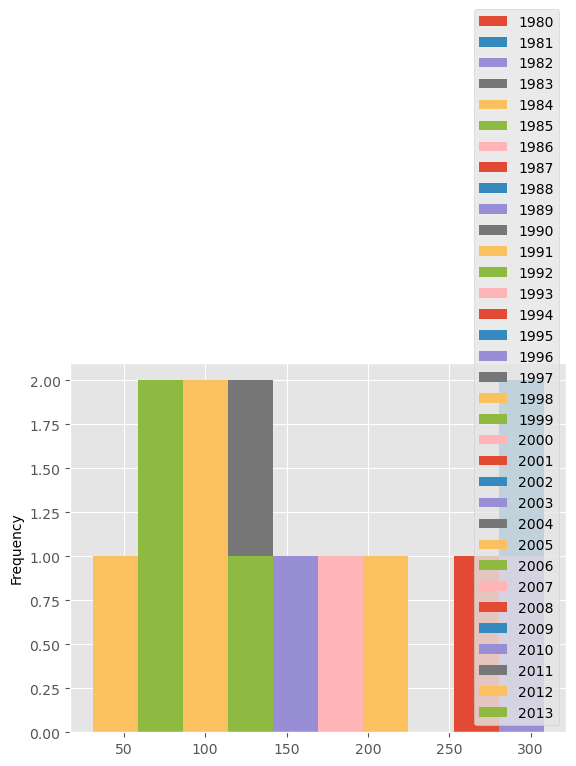

In [70]:
# generate histogram
df_can.loc[['Denmark', 'Norway', 'Sweden'], years].plot.hist()

Instead of plotting the population frequency distribution of the population for the 3 countries, pandas instead plotted the population frequency distribution for the years.

This can be easily fixed by first transposing the dataset, and then plotting as shown below.

In [72]:
# transpose dataframe
df_t = df_can.loc[['Denmark', 'Norway', 'Sweden'], years].transpose()
df_t.head(10)

Country,Denmark,Norway,Sweden
1980,272,116,281
1981,293,77,308
1982,299,106,222
1983,106,51,176
1984,93,31,128
1985,73,54,158
1986,93,56,187
1987,109,80,198
1988,129,73,171
1989,129,76,182


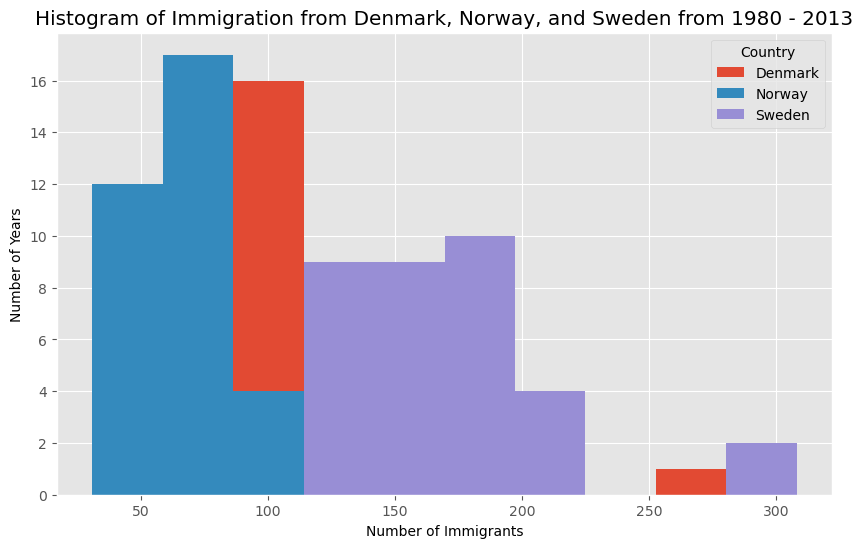

In [73]:
# generate histogram now
df_t.plot(kind='hist', figsize=(10, 6))

plt.title('Histogram of Immigration from Denmark, Norway, and Sweden from 1980 - 2013')
plt.ylabel('Number of Years')
plt.xlabel('Number of Immigrants')

plt.show()

Let's make a few modifications to improve the impact and aesthetics of the previous plot:

+ increase the bin size to 15 by passing in bins parameter;
+ set transparency to 60% by passing in alpha parameter;
+ label the x-axis by passing in x-label parameter;
+ change the colors of the plots by passing in color parameter.

[ 5 13 21 14  9 10  5  9  7  3  1  0  0  2  3]
[ 31.          49.46666667  67.93333333  86.4        104.86666667
 123.33333333 141.8        160.26666667 178.73333333 197.2
 215.66666667 234.13333333 252.6        271.06666667 289.53333333
 308.        ]


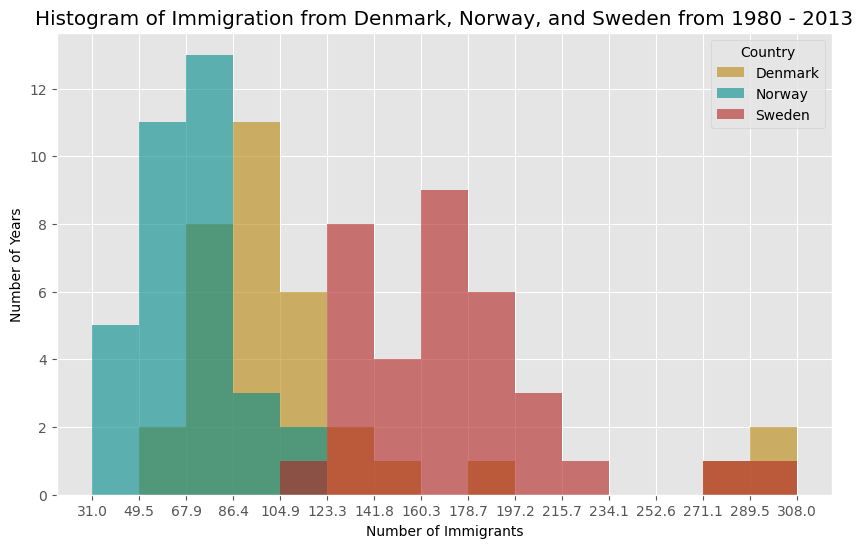

In [77]:
# let's get the x-tick values
count, bin_edges = np.histogram(df_t, 15)
print(count)
print(bin_edges)

# un-stacked histogram
df_t.plot(kind ='hist', 
          figsize=(10, 6),
          bins=15,
          alpha=0.6,
          xticks=bin_edges,
          color=['darkgoldenrod', 'darkcyan', 'firebrick']
         )

plt.title('Histogram of Immigration from Denmark, Norway, and Sweden from 1980 - 2013')
plt.ylabel('Number of Years')
plt.xlabel('Number of Immigrants')

plt.show()

**TIP FOR COLOURS**


Tip: For a full listing of colors available in Matplotlib, run the following code in your python shell:

In [75]:
import matplotlib
for name, hex in matplotlib.colors.cnames.items():
    print(name, hex)

aliceblue #F0F8FF
antiquewhite #FAEBD7
aqua #00FFFF
aquamarine #7FFFD4
azure #F0FFFF
beige #F5F5DC
bisque #FFE4C4
black #000000
blanchedalmond #FFEBCD
blue #0000FF
blueviolet #8A2BE2
brown #A52A2A
burlywood #DEB887
cadetblue #5F9EA0
chartreuse #7FFF00
chocolate #D2691E
coral #FF7F50
cornflowerblue #6495ED
cornsilk #FFF8DC
crimson #DC143C
cyan #00FFFF
darkblue #00008B
darkcyan #008B8B
darkgoldenrod #B8860B
darkgray #A9A9A9
darkgreen #006400
darkgrey #A9A9A9
darkkhaki #BDB76B
darkmagenta #8B008B
darkolivegreen #556B2F
darkorange #FF8C00
darkorchid #9932CC
darkred #8B0000
darksalmon #E9967A
darkseagreen #8FBC8F
darkslateblue #483D8B
darkslategray #2F4F4F
darkslategrey #2F4F4F
darkturquoise #00CED1
darkviolet #9400D3
deeppink #FF1493
deepskyblue #00BFFF
dimgray #696969
dimgrey #696969
dodgerblue #1E90FF
firebrick #B22222
floralwhite #FFFAF0
forestgreen #228B22
fuchsia #FF00FF
gainsboro #DCDCDC
ghostwhite #F8F8FF
gold #FFD700
goldenrod #DAA520
gray #808080
green #008000
greenyellow #ADFF2F


+ nIf we do not want the plots to overlap each other, we can stack them using the stacked parameter. 
+ Let's also adjust the min and max x-axis labels to remove the extra gap on the edges of the plot. 
+ We can pass a tuple (min,max) using the xlim paramater, as show below.

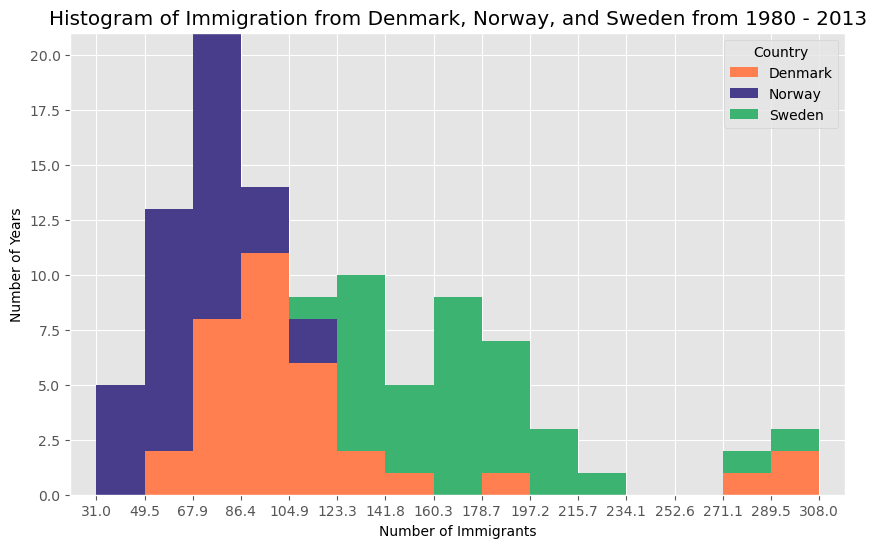

In [78]:
count, bin_edges = np.histogram(df_t, 15)
xmin = bin_edges[0] - 10   #  first bin value is 31.0, adding buffer of 10 for aesthetic purposes 
xmax = bin_edges[-1] + 10  #  last bin value is 308.0, adding buffer of 10 for aesthetic purposes

# stacked Histogram
df_t.plot(kind='hist',
          figsize=(10, 6), 
          bins=15,
          xticks=bin_edges,
          color=['coral', 'darkslateblue', 'mediumseagreen'],
          stacked=True,
          xlim=(xmin, xmax)
         )

plt.title('Histogram of Immigration from Denmark, Norway, and Sweden from 1980 - 2013')
plt.ylabel('Number of Years')
plt.xlabel('Number of Immigrants') 

plt.show()

**Question: Use the scripting layer to display the immigration distribution for Greece, Albania, and Bulgaria for years 1980 - 2013? Use an overlapping plot with 15 bins and a transparency value of 0.35.**

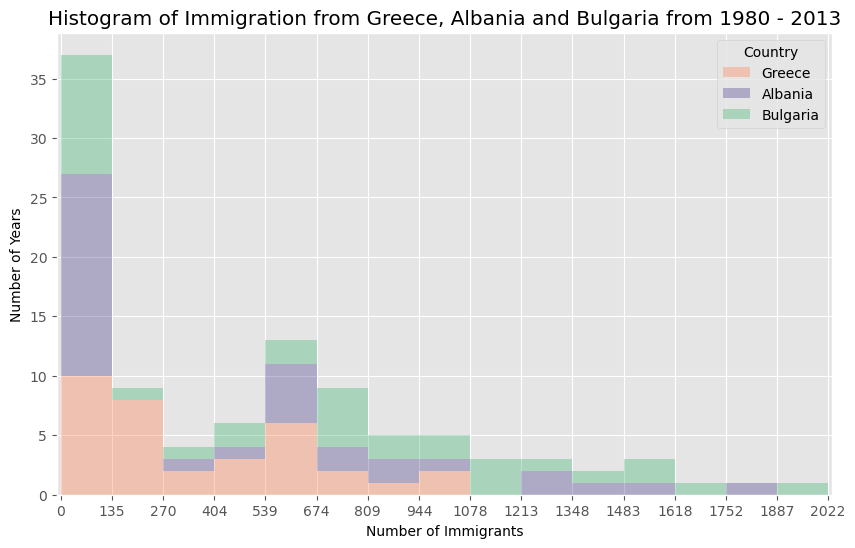

In [94]:
## view the dataset
## take the transpose of the dataframe
df_ = df_can.loc[["Greece", "Albania", "Bulgaria"], years].transpose()
df_.head(10)


## plot the graph
count, bin_edges = np.histogram(df_, 15)
xmin = bin_edges[0] - 10   #  first bin value is 31.0, adding buffer of 10 for aesthetic purposes 
xmax = bin_edges[-1] + 10  #  last bin value is 308.0, adding buffer of 10 for aesthetic purposes

# stacked Histogram
df_.plot(kind='hist',
          figsize=(10, 6), 
          bins=15,
          xticks=bin_edges,
          color=['coral', 'darkslateblue', 'mediumseagreen'],
          stacked=True,
          xlim=(xmin, xmax),
          alpha = 0.35
         )

plt.title('Histogram of Immigration from Greece, Albania and Bulgaria from 1980 - 2013')
plt.ylabel('Number of Years')
plt.xlabel('Number of Immigrants') 

plt.show()

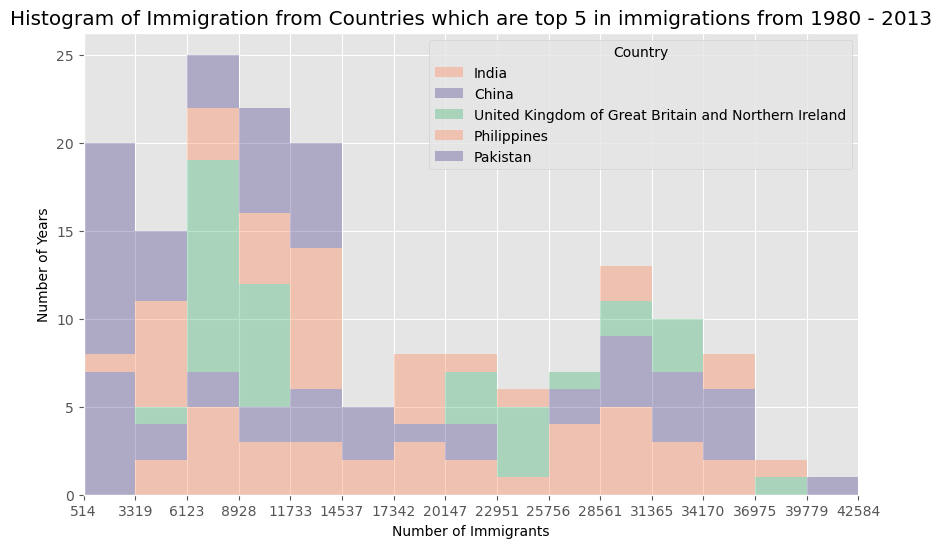

In [95]:
df__ = df_can.loc[["India", "China", "United Kingdom of Great Britain and Northern Ireland", "Philippines", "Pakistan"], years].transpose()
df__.head()

## plot the graph
count, bin_edges = np.histogram(df__, 15)
xmin = bin_edges[0] - 10   #  first bin value is 31.0, adding buffer of 10 for aesthetic purposes 
xmax = bin_edges[-1] + 10  #  last bin value is 308.0, adding buffer of 10 for aesthetic purposes

# stacked Histogram
df__.plot(kind='hist',
          figsize=(10, 6), 
          bins=15,
          xticks=bin_edges,
          color=['coral', 'darkslateblue', 'mediumseagreen'],
          stacked=True,
          xlim=(xmin, xmax),
          alpha = 0.35
         )

plt.title('Histogram of Immigration from Countries which are top 5 in immigrations from 1980 - 2013')
plt.ylabel('Number of Years')
plt.xlabel('Number of Immigrants') 

plt.show()

**BAR CHARTS**

+ A bar plot is a way of representing data where the length of the bars represents the magnitude/size of the feature/variable. 
+ Bar graphs usually represent numerical and categorical variables grouped in intervals.

To create a bar plot, we can pass one of two arguments via kind parameter in plot():

+ kind=bar creates a vertical bar plot
+ kind=barh creates a horizontal bar plot

**Vertical bar plot**

+ In vertical bar graphs, the x-axis is used for labelling, and the length of bars on the y-axis corresponds to the magnitude of the variable being measured. 
+ `Vertical bar graphs are particularly useful in analyzing time series data.` 
+ One disadvantage is that they lack space for text labelling at the foot of each bar.

**Analyse the effect of Iceland's Financial Crisis:**

+ The 2008 - 2011 Icelandic Financial Crisis was a major economic and political event in Iceland. 
+ Relative to the size of its economy, Iceland's systemic banking collapse was the largest experienced by any country in economic history. 
+ The crisis led to a severe economic depression in 2008 - 2011 and significant political unrest.

**Question: Let's compare the number of Icelandic immigrants (country = 'Iceland') to Canada from year 1980 to 2013.**

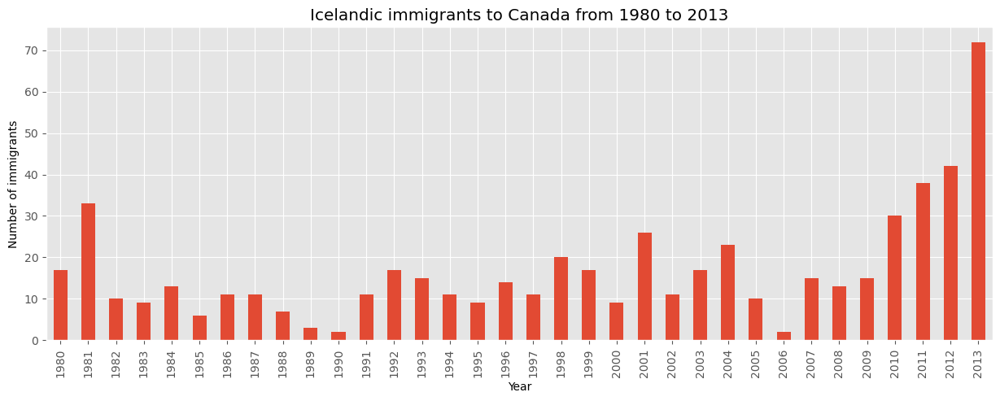

In [108]:
df_iceland = df_can.loc["Iceland", years]
df_iceland.head()

# step 2: plot data
df_iceland.plot(kind='bar', figsize=(15, 5))

plt.xlabel('Year') # add to x-label to the plot
plt.ylabel('Number of immigrants') # add y-label to the plot
plt.title('Icelandic immigrants to Canada from 1980 to 2013') # add title to the plot

plt.show()

The bar plot above shows the total number of immigrants broken down by each year. We can clearly see the impact of the financial crisis; the number of immigrants to Canada started increasing rapidly after 2008.

Let's annotate this on the plot using the annotate method of the scripting layer or the pyplot interface. We will pass in the following parameters:

+ `s`: str, the text of annotation.
+ `xy`: Tuple specifying the (x,y) point to annotate (in this case, end point of arrow).
+ `xytext`: Tuple specifying the (x,y) point to place the text (in this case, start point of arrow).
+ `xycoords`: The coordinate system that xy is given in - 'data' uses the coordinate system of the object being annotated (default).
+ `arrowprops`: Takes a dictionary of properties to draw the arrow:
    + `arrowstyle`: Specifies the arrow style, '->' is standard arrow.
    + `connectionstyle`: Specifies the connection type. arc3 is a straight line.
    + `color`: Specifies color of arrow.
    + `lw`: Specifies the line width.

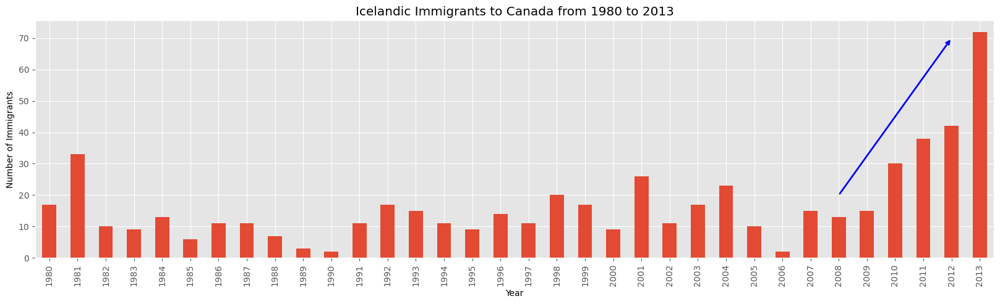

In [110]:
df_iceland.plot(kind='bar', figsize=(20, 5), rot=90)  # rotate the xticks(labelled points on x-axis) by 90 degrees

plt.xlabel('Year')
plt.ylabel('Number of Immigrants')
plt.title('Icelandic Immigrants to Canada from 1980 to 2013')

# Annotate arrow
plt.annotate('',  # s: str. Will leave it blank for no text
             xy=(32, 70),  # place head of the arrow at point (year 2012 , pop 70)
             xytext=(28, 20),  # place base of the arrow at point (year 2008 , pop 20)
             xycoords='data',  # will use the coordinate system of the object being annotated
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=2)
             )

plt.show()

Let's also annotate a text to go over the arrow. We will pass in the following additional parameters:

+ `rotation`: rotation angle of text in degrees (counter clockwise)
+ `va`: vertical alignment of text `[‘center’ | ‘top’ | ‘bottom’ | ‘baseline’]`
+ `ha`: horizontal alignment of text `[‘center’ | ‘right’ | ‘left’]`

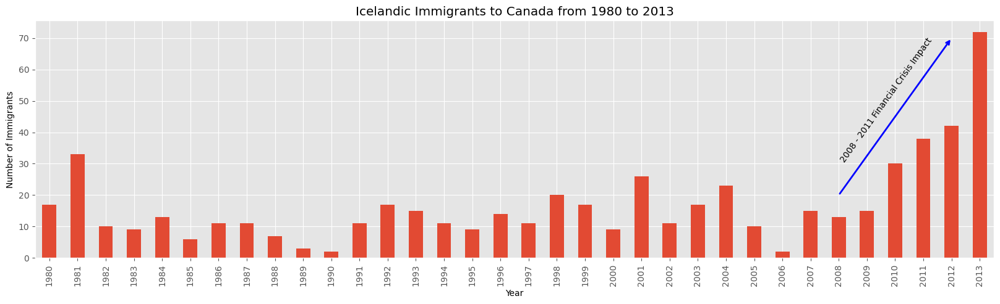

In [119]:
df_iceland.plot(kind='bar', figsize=(20, 5), rot=90)

plt.xlabel('Year')
plt.ylabel('Number of Immigrants')
plt.title('Icelandic Immigrants to Canada from 1980 to 2013')

# Annotate arrow
plt.annotate('',  # s: str. will leave it blank for no text
             xy=(32, 70),  # place head of the arrow at point (year 2012 , pop 70)
             xytext=(28, 20),  # place base of the arrow at point (year 2008 , pop 20)
             xycoords='data',  # will use the coordinate system of the object being annotated
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=2)
             )

# Annotate Text
plt.annotate('2008 - 2011 Financial Crisis Impact',  # text to display
             xy=(28, 30),  # start the text at at point (year 2008 , pop 30)
             rotation=54.5,  # based on trial and error to match the arrow
             va='bottom',  # want the text to be vertically 'bottom' aligned
             ha='left',  # want the text to be horizontally 'left' algned.
             )

plt.show()

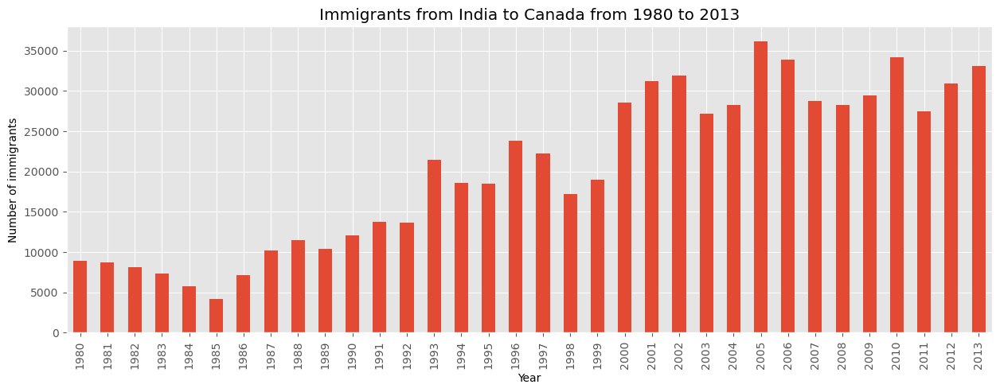

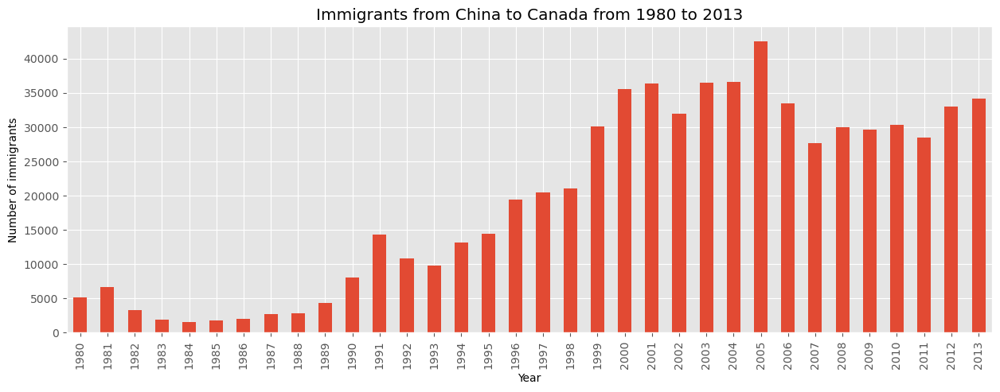

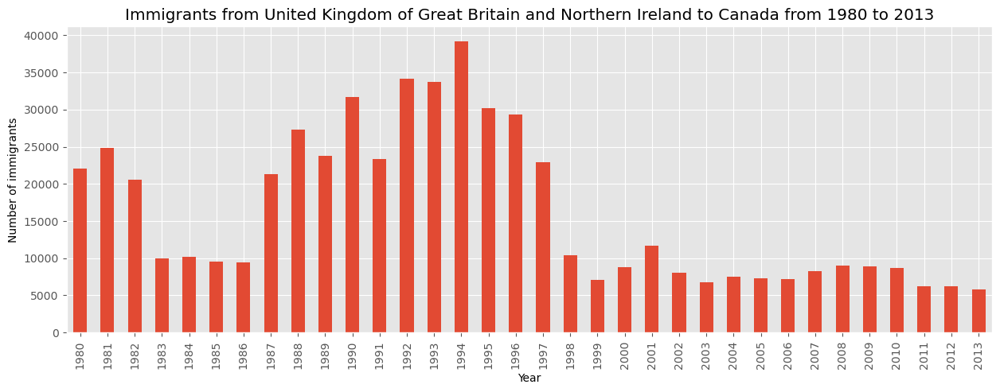

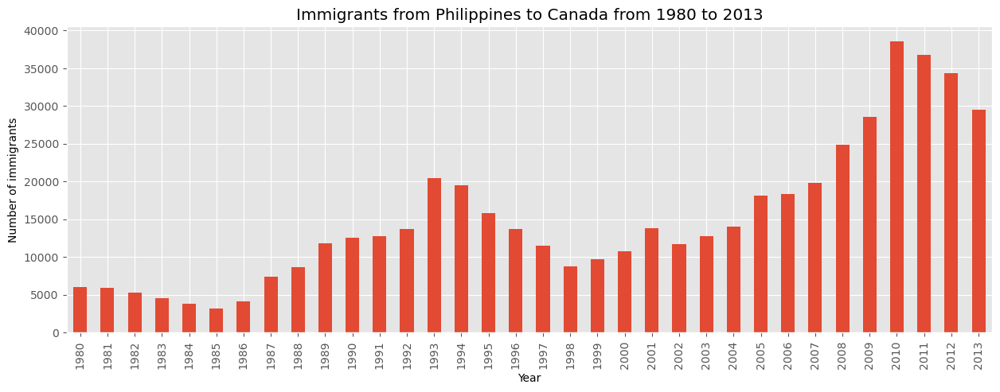

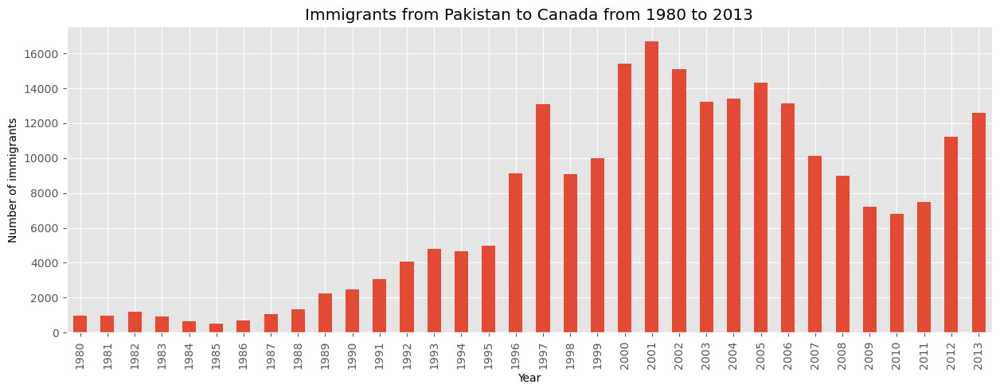

...

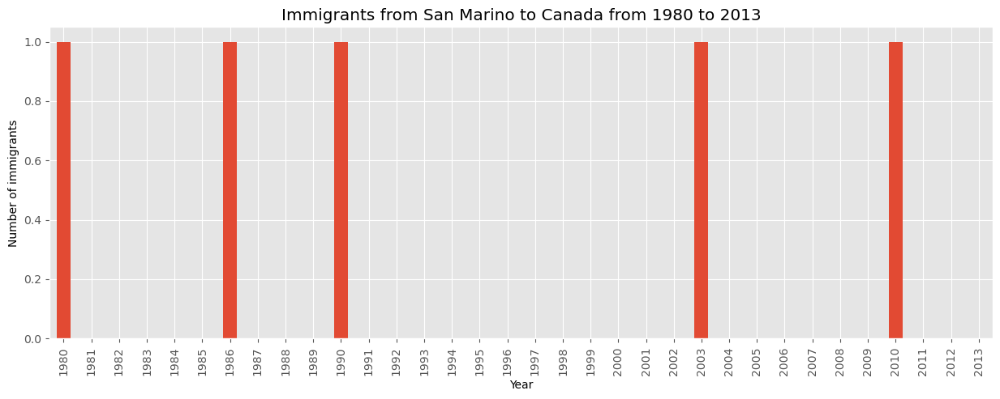

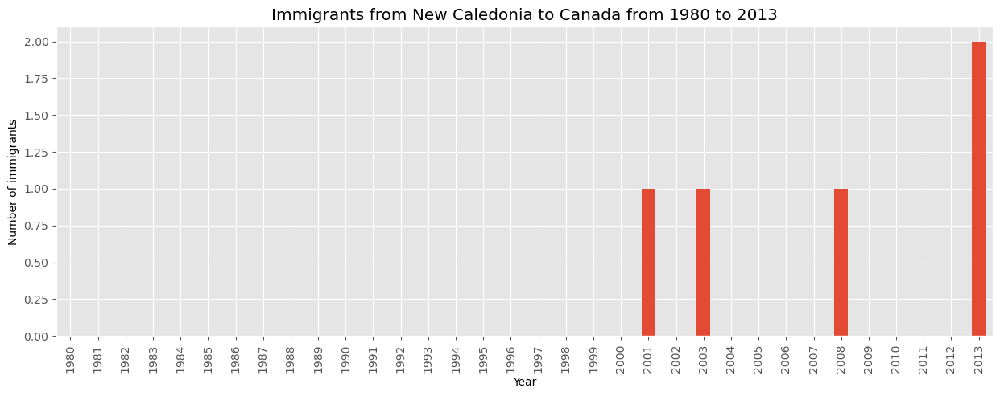

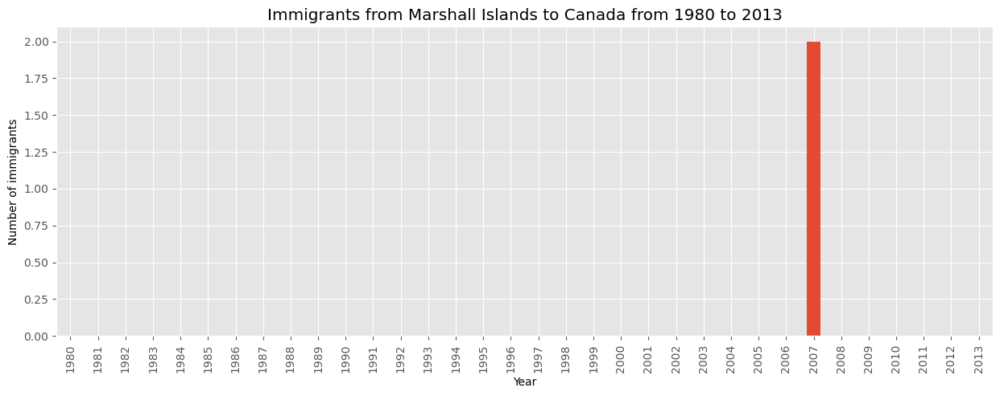

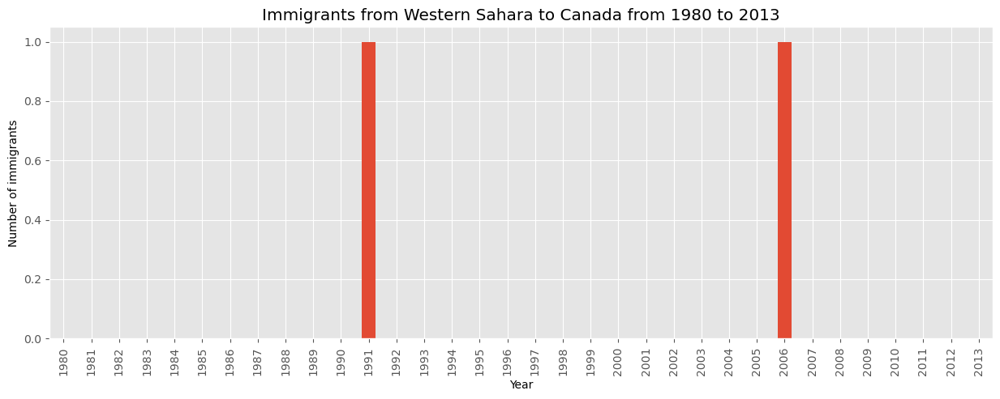

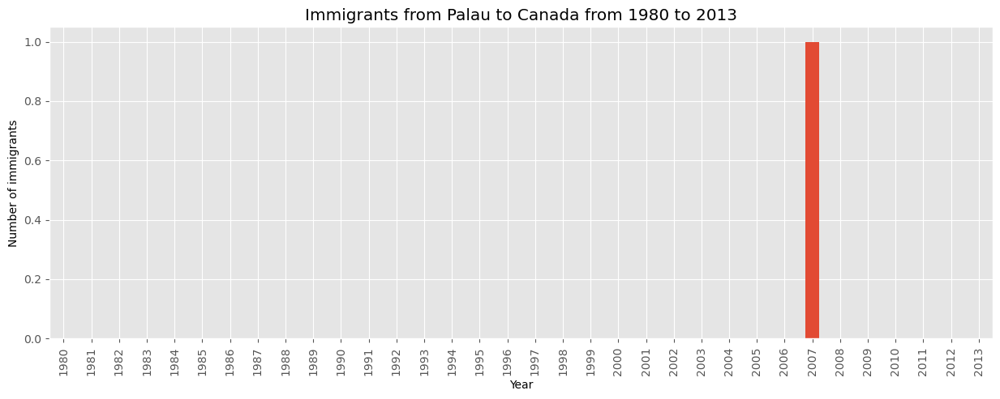

In [131]:
countries = df_can.index.values.tolist()
#print(countries)

for country in countries:
    #print(country)
    df_country = df_can.loc[country, years]
    # step 2: plot data
    df_country.plot(kind='bar', figsize=(15, 5))

    plt.xlabel('Year') # add to x-label to the plot
    plt.ylabel('Number of immigrants') # add y-label to the plot
    plt.title('Immigrants from ' + country + ' to Canada from 1980 to 2013') # add title to the plot

    plt.show()

**Horizontal Bar Plot**

+ Sometimes it is more practical to represent the data horizontally, especially if you need more room for labelling the bars. 
+ In horizontal bar graphs, the y-axis is used for labelling, and the length of bars on the x-axis corresponds to the magnitude of the variable being measured. 
+ As you will see, there is more room on the y-axis to label categorical variables.

**Question: Using the scripting later and the df_can dataset, create a horizontal bar plot showing the total number of immigrants to Canada from the top 15 countries, for the period 1980 - 2013. Label each country with the total immigrant count.**

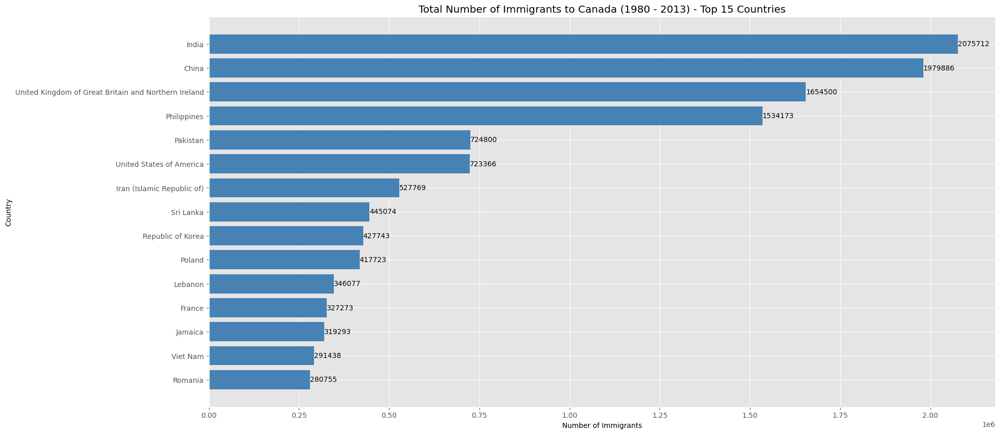

In [173]:
# Find the top 15 countries
df_top_15 = df_can.head(15)
df_top_15 = df_top_15.drop(['Continent', 'Region', 'Developed / Developing'], axis=1)

# Calculate total immigrant count for each country
df_top_15['Total'] = df_top_15.sum(axis=1)

# Sort the DataFrame by the 'Total' column in descending order
df_top_15.sort_values(by='Total', ascending=True, inplace=True)

# Generate the horizontal bar plot
plt.figure(figsize=(20, 10))
plt.barh(df_top_15.index, df_top_15['Total'], color='steelblue')

# Add labels to each bar
for i, v in enumerate(df_top_15['Total']):
    plt.text(v, i, str(v), va='center')

# Set the plot title and axis labels
plt.title('Total Number of Immigrants to Canada (1980 - 2013) - Top 15 Countries')
plt.xlabel('Number of Immigrants')
plt.ylabel('Country')

# Display the plot
plt.show()


**HORIZONTAL BAR CHART TO VISUALIZE INDIAN IMMIGRANTS FROM 1980 - 2013**

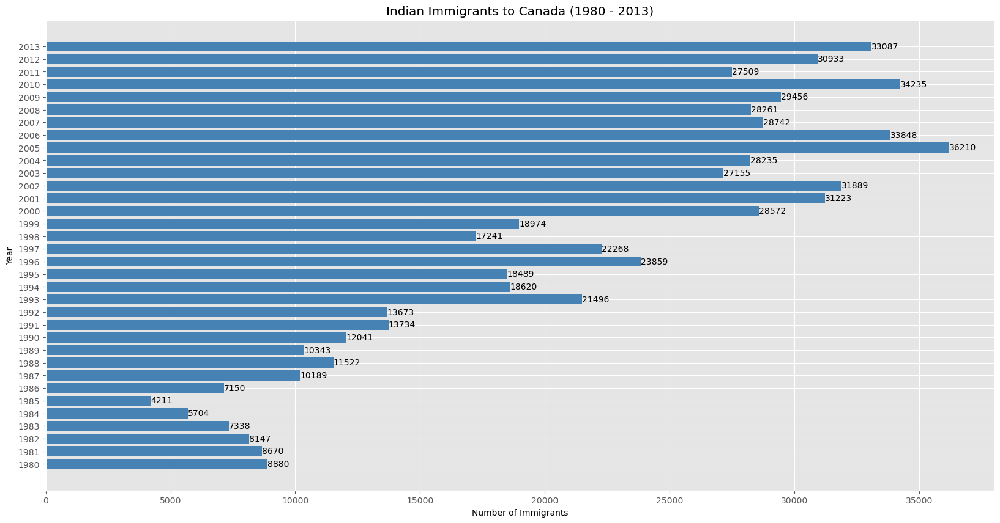

In [196]:
df_india = df_can.loc["India", years]
df_india.head()

# Generate the horizontal bar plot
plt.figure(figsize=(20, 10))
plt.barh(df_india.index, df_india[years], color='steelblue')

# Add labels to each bar
for i, v in enumerate(df_india):
    plt.text(v, i, str(v), va='center')

# Set the plot title and axis labels
plt.title('Indian Immigrants to Canada (1980 - 2013)')
plt.xlabel('Number of Immigrants')
plt.ylabel('Year')

# Display the plot
plt.show()

**Question : I want to visualize a horizontal bar chart which visualize the sum of immigrants from continent asia to canada from 1980 to 2013**

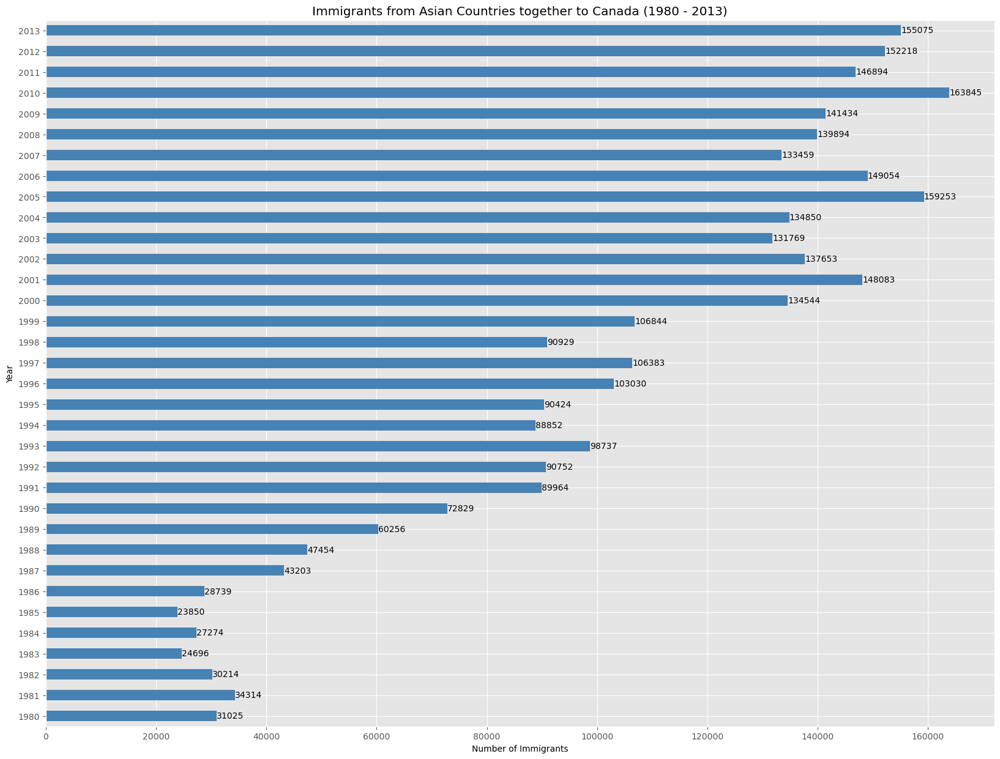

In [197]:
# Filter the data for Asian countries from 1980 to 2013
df_asia = df_can[df_can['Continent'] == 'Asia'].loc[:, '1980':'2013']
# take the sum
df_asia = df_asia.sum()
# df_asia
# Generate the horizontal bar plot
plt.figure(figsize=(20, 15))
df_asia.plot(kind='barh', color='steelblue')

# Add labels to each bar
for i, v in enumerate(df_asia):
    plt.text(v, i, str(v), va='center')

# Set the plot title and axis labels
plt.title('Immigrants from Asian Countries together to Canada (1980 - 2013)')
plt.xlabel('Number of Immigrants')
plt.ylabel('Year')

# Display the plot
plt.show()

*******